data 가져와서 dataframe 만들기

In [2]:
df_raw = pd.read_csv('../train.csv')
df_raw.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


# 데이터 살펴보기

## None 값 보기

In [3]:
# 각 column에 none 값이 몇개 있는지 보기
# count NaN
def nan_check(df_raw):
    null_check = df_raw.isnull().sum()
    null_count = pd.DataFrame({'column' : null_check.index, 'NaN' : null_check.values})
    # None 값이 있는 column만 가져옴.
    null_count = null_count.query('NaN > 0')
    return(null_count)

nan_check(df_raw)

,NaN,column
3,259,LotFrontage
6,1369,Alley
25,8,MasVnrType
26,8,MasVnrArea
30,37,BsmtQual
31,37,BsmtCond
32,38,BsmtExposure
33,37,BsmtFinType1
35,38,BsmtFinType2
42,1,Electrical


## 각 컬럼의 정보 보기

In [4]:
# 각 컬럼의 정보 보기
df_info = df_raw.info()
df_info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

## SalePrice 데이터 살펴보기

In [5]:
df_raw['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

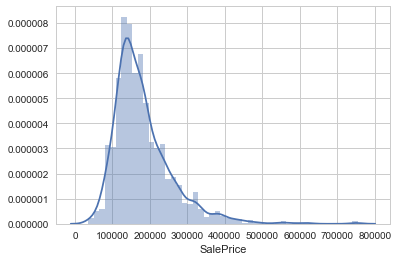

In [6]:
# SalePrice의 데이터 분포 시각화1
sns.distplot(df_raw['SalePrice'])

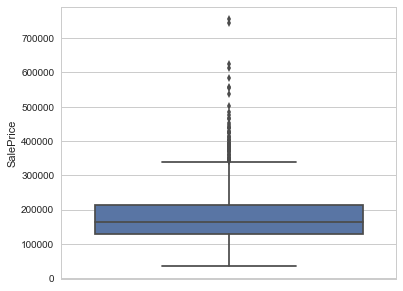

In [7]:
# SalePrice의 데이터 분포 시각화2
plt.rcParams["figure.figsize"] = (6,5)
sns.boxplot(y="SalePrice", data=df_raw)
plt.show()

## 타입별로 dataframe 나누기(숫자/문자)

In [8]:
# string인 column만 선별하기. dtype이 'O' (object)인 col만 가져옴.
# string이면 True를 숫자 타입이면 False를 return

def isstr(col):
    if col.dtype == 'O':
        return True
    else:
        return False

In [9]:
# string type(정확히는 Object 타입) column만 가져오기

strcol_name=[]
i=0
col_names = df_raw.columns

for col in col_names:
    if isstr(df_raw[col]):
        strcol_name.append(i)
    i+=1
    
# SalePrice가 있는 col 포함 시켜주기 = 80번째
strcol_name.append(80)

# str 컬럼의 idx를 가져와서 str type col 만 df_str에 넣어줌.
df_str = df_raw.iloc[:, strcol_name]
df_str.tail()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
1455,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,...,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal,175000
1456,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,...,Unf,TA,TA,Y,NaN,MnPrv,NaN,WD,Normal,210000
1457,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,...,RFn,TA,TA,Y,NaN,GdPrv,Shed,WD,Normal,266500
1458,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,...,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Normal,142125
1459,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,...,Fin,TA,TA,Y,NaN,NaN,NaN,WD,Normal,147500


In [10]:
# 숫자타입 column만 가져오기

numcol_name=[]
i=0
col_names = df_raw.columns

for col in col_names:
    if isstr(df_raw[col]) == False:
        numcol_name.append(i)
    i+=1

# 숫자타입 컬럼의 idx를 가져와서 숫자타입 col 만 df_num에 넣어줌.
df_num = df_raw.iloc[:, numcol_name]
df_num.tail()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
1455,1456,60,62.0,7917,6,5,1999,2000,0.0,0,...,0,40,0,0,0,0,0,8,2007,175000
1456,1457,20,85.0,13175,6,6,1978,1988,119.0,790,...,349,0,0,0,0,0,0,2,2010,210000
1457,1458,70,66.0,9042,7,9,1941,2006,0.0,275,...,0,60,0,0,0,0,2500,5,2010,266500
1458,1459,20,68.0,9717,5,6,1950,1996,0.0,49,...,366,0,112,0,0,0,0,4,2010,142125
1459,1460,20,75.0,9937,5,6,1965,1965,0.0,830,...,736,68,0,0,0,0,0,6,2008,147500


## 카테고리(문자타입) 각 항목에 숫자 할당하기(Median 기준)

In [11]:
# df_str 값들을 숫자로 바꿔주기
# Median을 기준으로, Median 기준으로 카테고리를 오름차순해서 숫자로 변환
# 

df_str_new = df_str.copy()

col_names = df_str_new.columns[0:-1]
for col_name in col_names:
    df1 = pd.DataFrame(df_str_new, columns=[col_name,"SalePrice"])  
    df2 = df1.groupby([col_name])["SalePrice"].median().reset_index(name='Median').sort_values('Median').reset_index(drop=True)
    def isgrade(data) :
        for idx in range(len(df2)):
            if data == df2[col_name][idx]:
                return idx+1
    df_str_new[col_name + 'Grade'] = df_str_new[col_name].apply(isgrade)
    
df_str_new = df_str_new.iloc[:,44:]

df_str_new["SalePrice"] = df_str["SalePrice"]

df_str_new.tail()

,MSZoningGrade,StreetGrade,AlleyGrade,LotShapeGrade,LandContourGrade,UtilitiesGrade,LotConfigGrade,LandSlopeGrade,NeighborhoodGrade,Condition1Grade,...,GarageFinishGrade,GarageQualGrade,GarageCondGrade,PavedDriveGrade,PoolQCGrade,FenceGrade,MiscFeatureGrade,SaleTypeGrade,SaleConditionGrade,SalePrice
1455,4,2,NaN,1,2,2,1,1,14,4,...,2.0,4.0,5.0,3,NaN,NaN,NaN,6,5,175000
1456,4,2,NaN,1,2,2,1,1,15,4,...,1.0,4.0,5.0,3,NaN,2.0,NaN,6,5,210000
1457,4,2,NaN,1,2,2,1,1,19,4,...,2.0,4.0,5.0,3,NaN,4.0,2.0,6,5,266500
1458,4,2,NaN,1,2,2,1,1,10,4,...,1.0,4.0,5.0,3,NaN,NaN,NaN,6,5,142125
1459,4,2,NaN,1,2,2,1,1,5,4,...,3.0,4.0,5.0,3,NaN,NaN,NaN,6,5,147500


## 카테고리별로 어떤 숫자가 부여됐는지 확인

In [12]:
# 각 카테고리별로 부여된 숫자를 보여주는 함수 추가

def idx_search(df_new1, num):
    col_name = df_new1.columns[num]
    df1 = pd.DataFrame(df_new1, columns=[col_name,"SalePrice"])  
    idx_df = df1.groupby([col_name])["SalePrice"].median().reset_index(name='Median').sort_values('Median').reset_index(drop=True)
    idx_df['idx'] = [i for i in range(1,len(idx_df)+1)] # 인덱스 컬럼 생성
    idx_df = idx_df[['idx', col_name, 'Median']] # 인덱스, 원래 카테고리 이름, 중앙값 순서대로 배치
    print(col_name)
    print(idx_df)

# 모든 카테고리 값에 대해 부여된 숫자 확인하기
df_cat = df_str.copy()
for i in range(0,df_cat.shape[1]-1):
    idx_search(df_cat,i)

MSZoning
   idx MSZoning  Median
0    1  C (all)   74700
1    2       RM  120500
2    3       RH  136500
3    4       RL  174000
4    5       FV  205950
Street
   idx Street  Median
0    1   Grvl  114250
1    2   Pave  163000
Alley
   idx Alley  Median
0    1  Grvl  119500
1    2  Pave  172500
LotShape
   idx LotShape  Median
0    1      Reg  146000
1    2      IR1  189000
2    3      IR3  203570
3    4      IR2  221000
LandContour
   idx LandContour  Median
0    1         Bnk  139400
1    2         Lvl  162900
2    3         Low  190000
3    4         HLS  222250
Utilities
   idx Utilities  Median
0    1    NoSeWa  137500
1    2    AllPub  163000
LotConfig
   idx LotConfig    Median
0    1    Inside  159697.5
1    2    Corner  160000.0
2    3       FR2  165000.0
3    4       FR3  195450.0
4    5   CulDSac  199262.0
LandSlope
   idx LandSlope  Median
0    1       Gtl  161875
1    2       Sev  185000
2    3       Mod  186700
Neighborhood
    idx Neighborhood  Median
0     1      MeadowV

# 시각화 및 상관관계 확인

## 숫자타입 데이터에 대해 joint plot 그리기

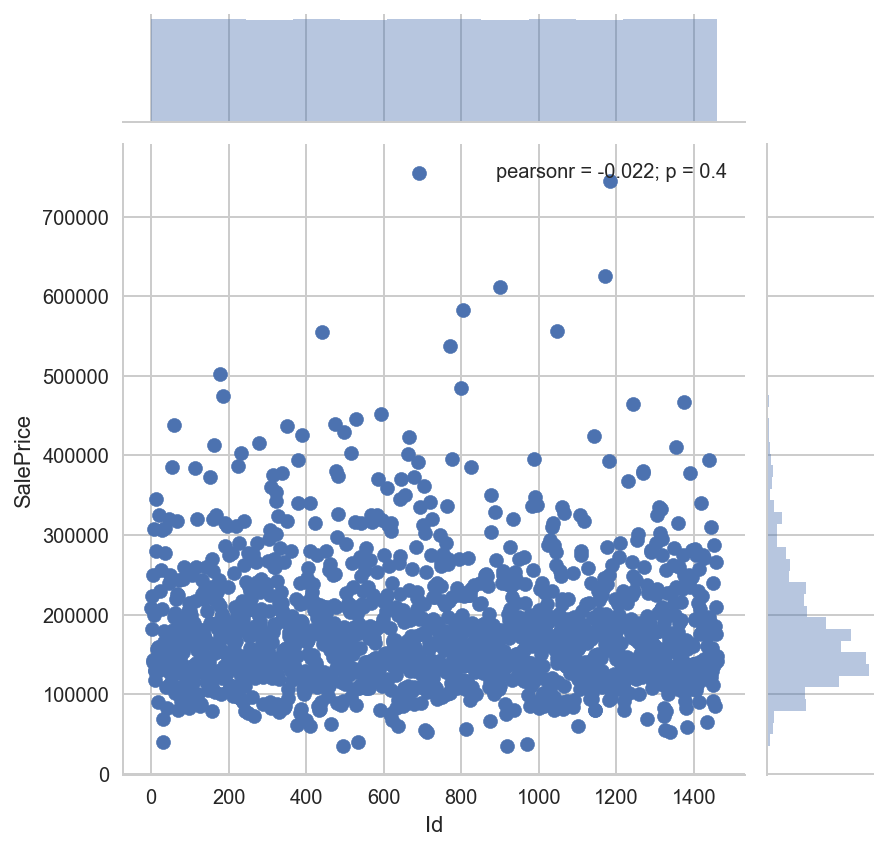

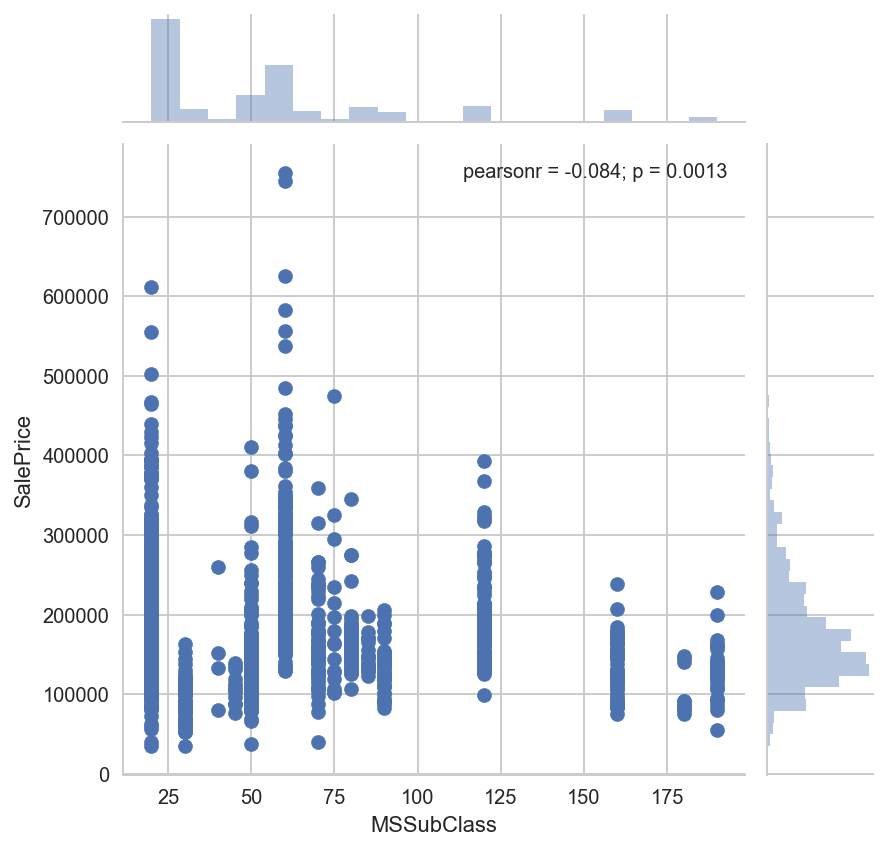

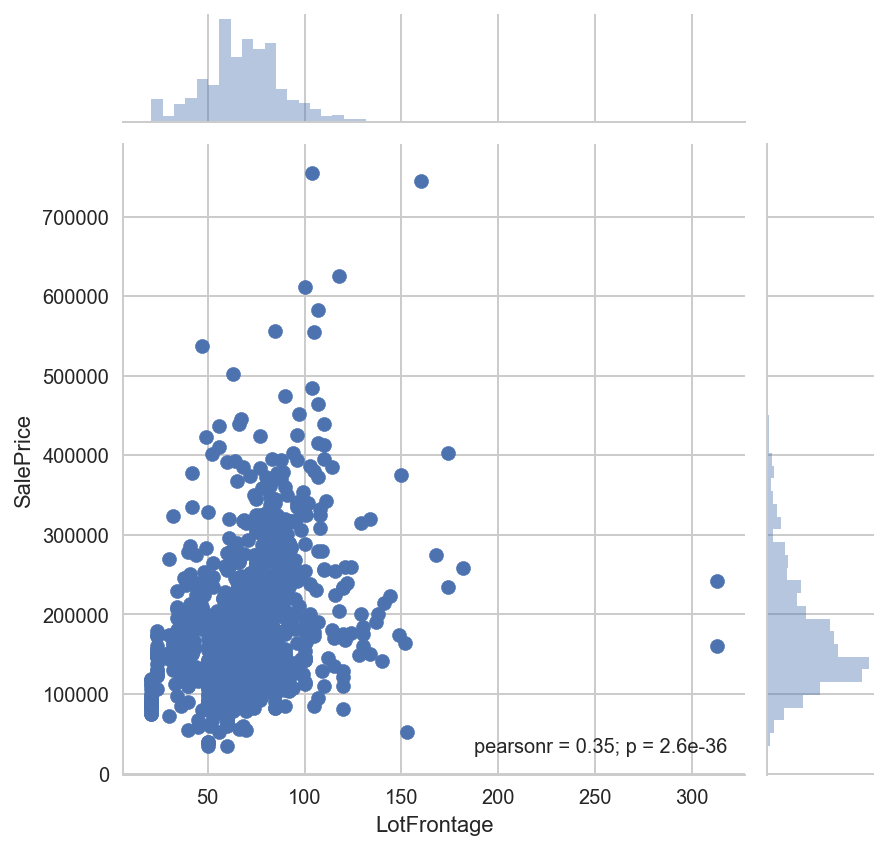

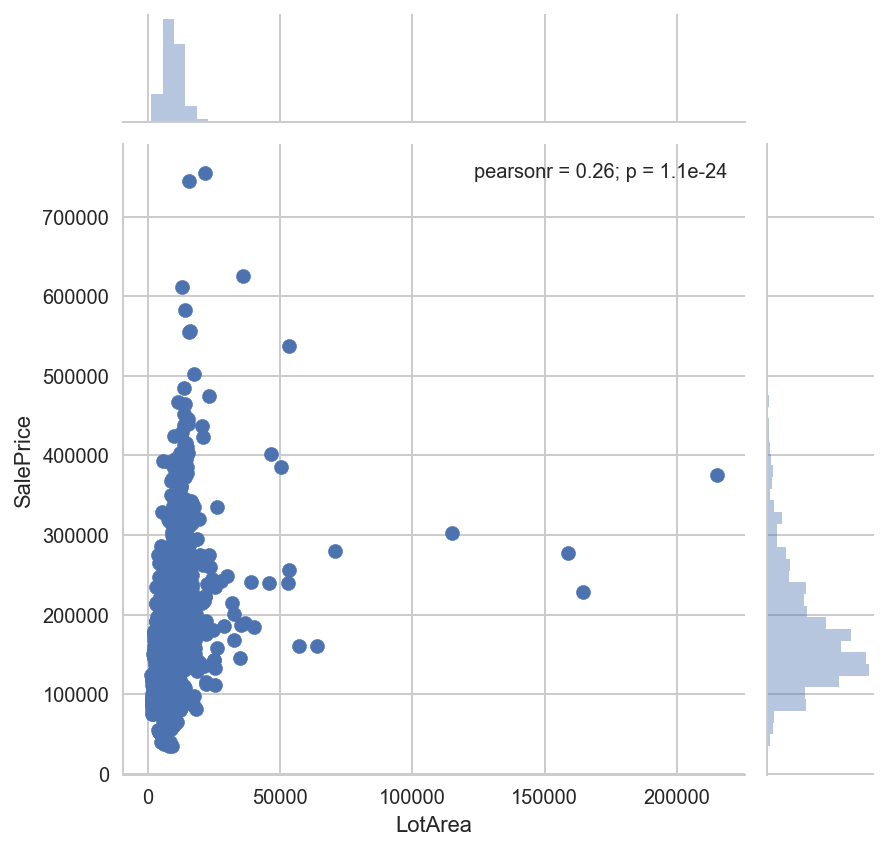

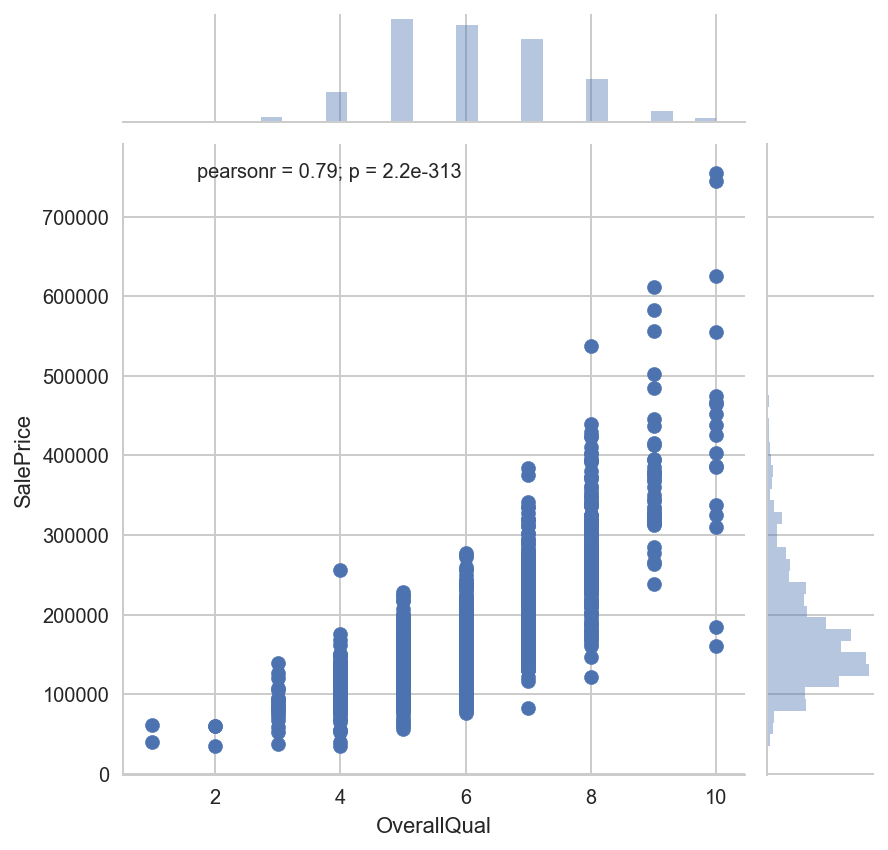

...

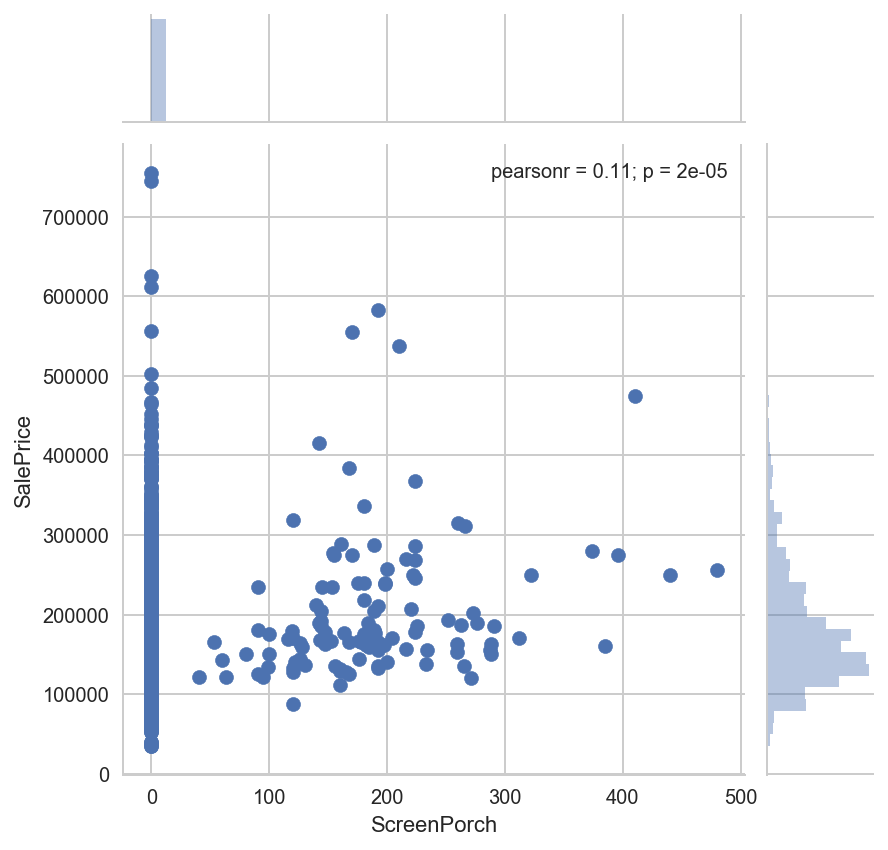

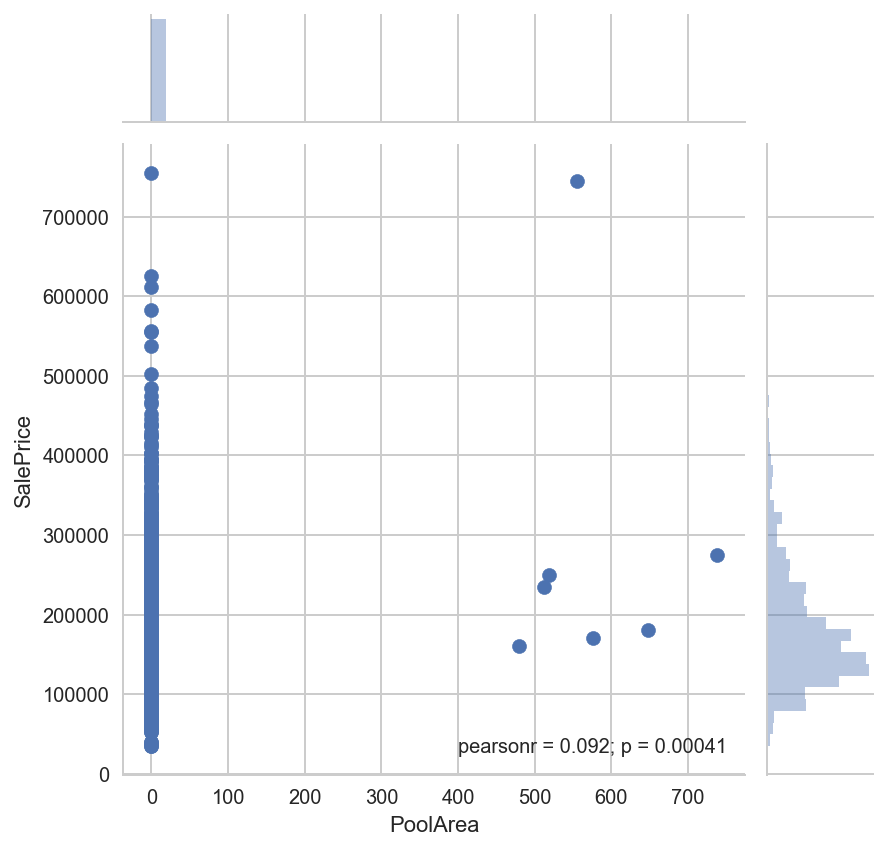

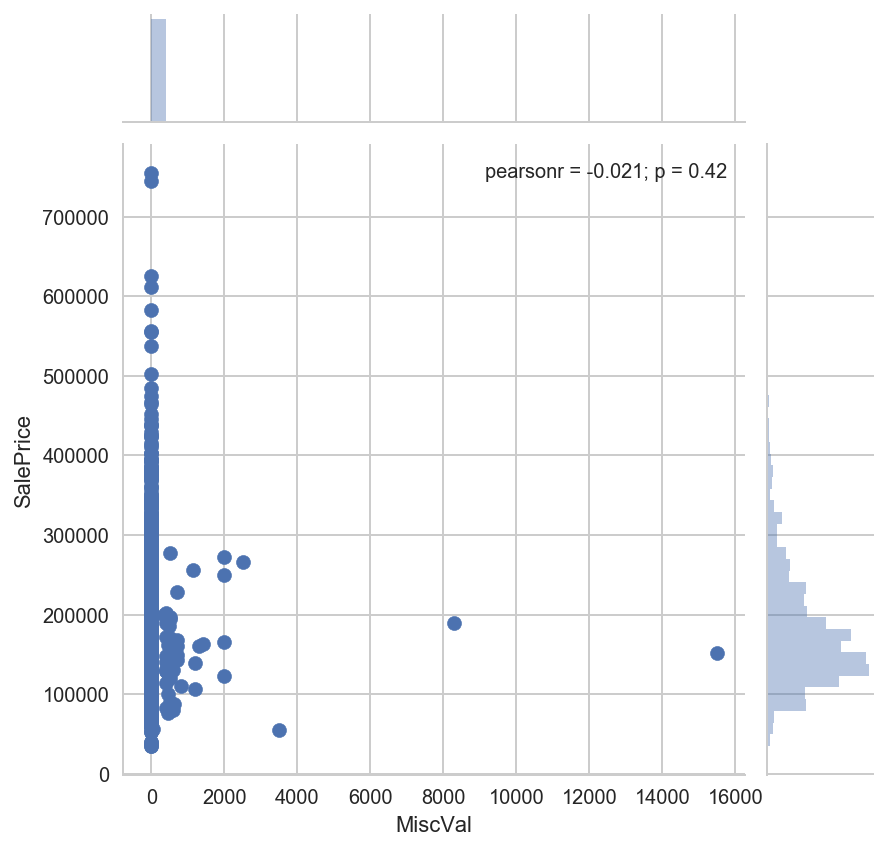

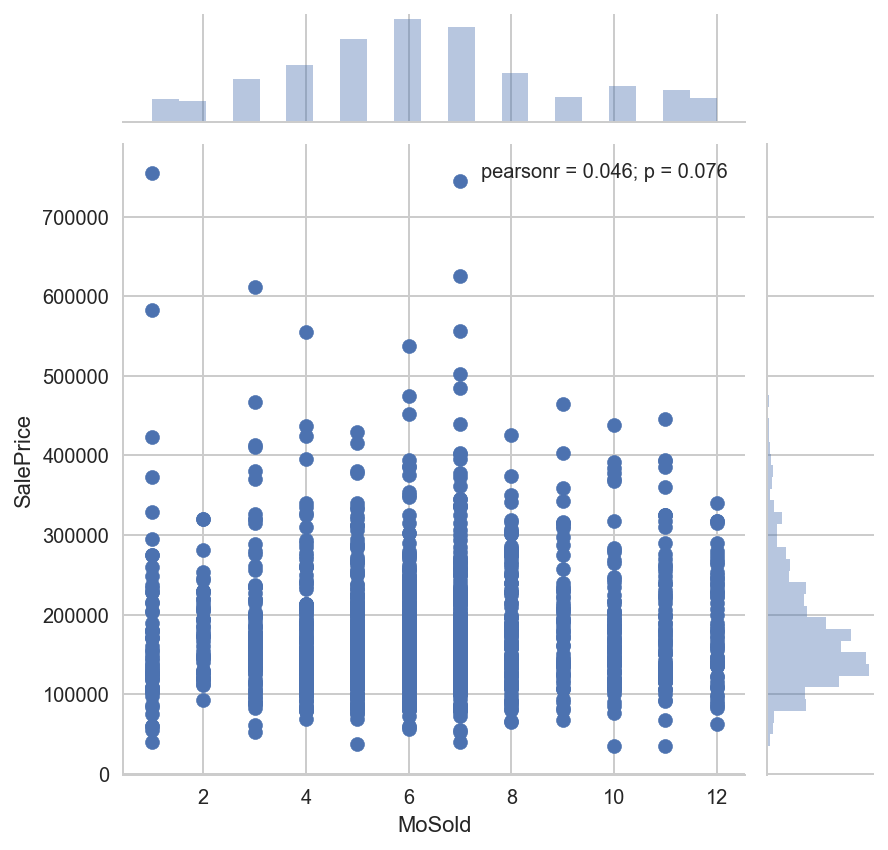

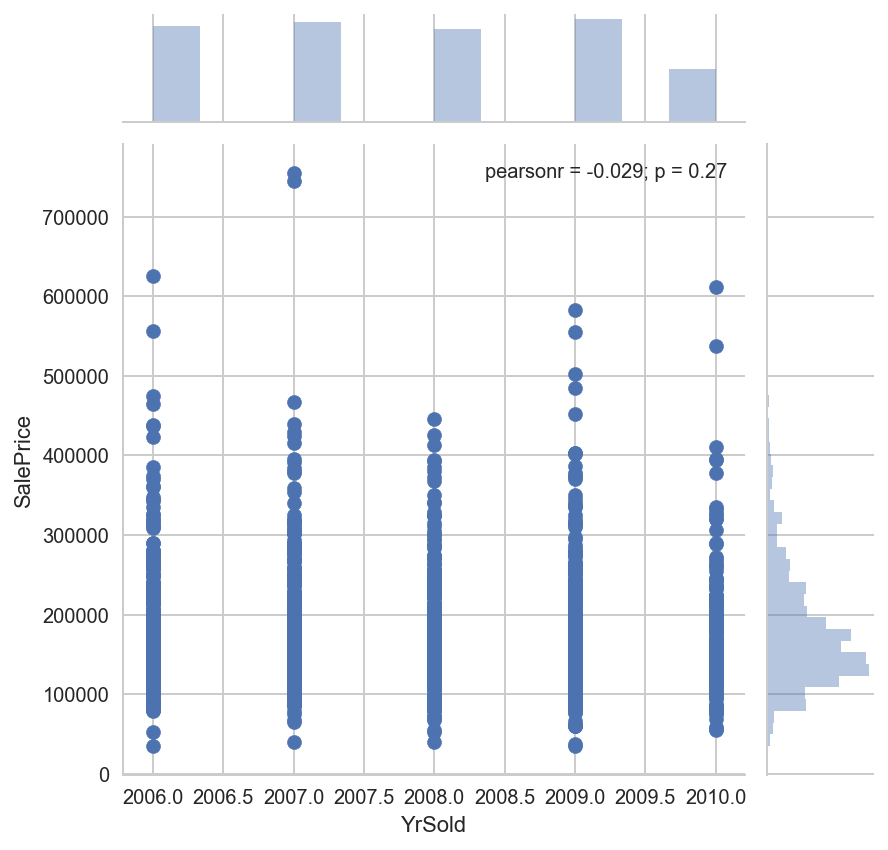

In [74]:
col_names = df_num.columns
for col_name in col_names[:-1]:
    sns.jointplot(x=col_name, y="SalePrice", data=df_num)
    plt.show()

## 문자 타입 데이터에 대해 violin plot과 box plot 그리기

In [17]:
#plot을 그려주는 show_viobox라는 함수 정의

def show_viobox(df,col_name):
    print(col_name)
        
    # 각 항목에 대한 빈도 출력 / df2 dataframe 따로 생성
    df2 = pd.DataFrame(df[col_name])
    counts = df2.groupby([col_name]).size().reset_index(name='Counts')
    print(counts)
        
    plt.subplot(121)
    sns.violinplot(x=col_name, y='SalePrice', data=df)
    plt.subplot(122)
    sns.boxplot(x=col_name, y='SalePrice', data=df)
    plt.show()

MSZoning
  MSZoning  Counts
0  C (all)      10
1       FV      65
2       RH      16
3       RL    1151
4       RM     218


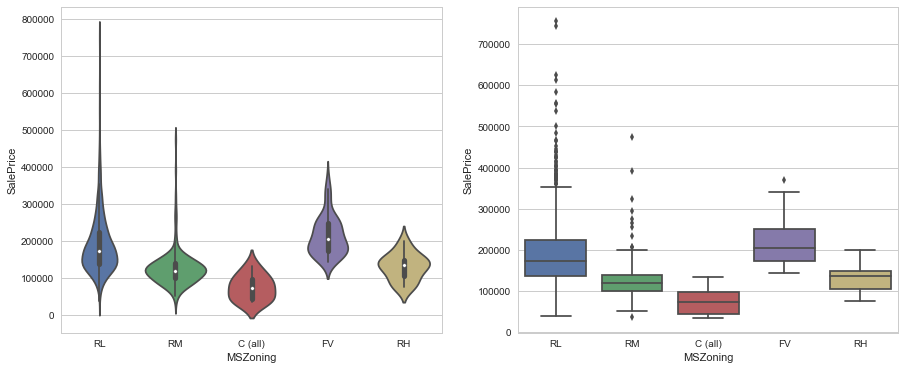

Street
  Street  Counts
0   Grvl       6
1   Pave    1454


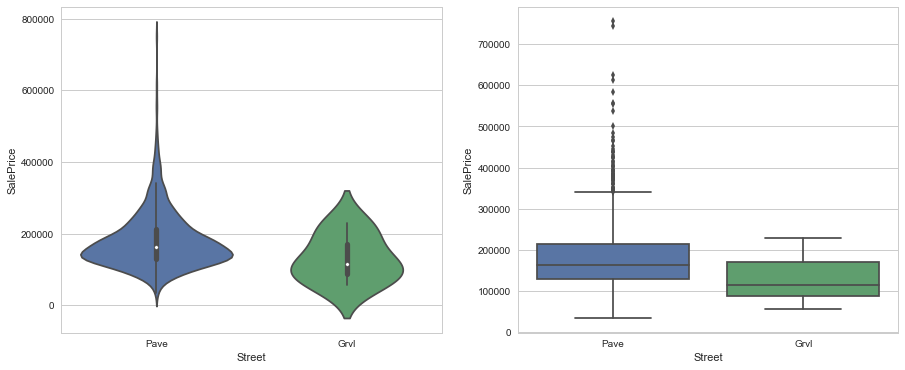

Alley
  Alley  Counts
0  Grvl      50
1  Pave      41


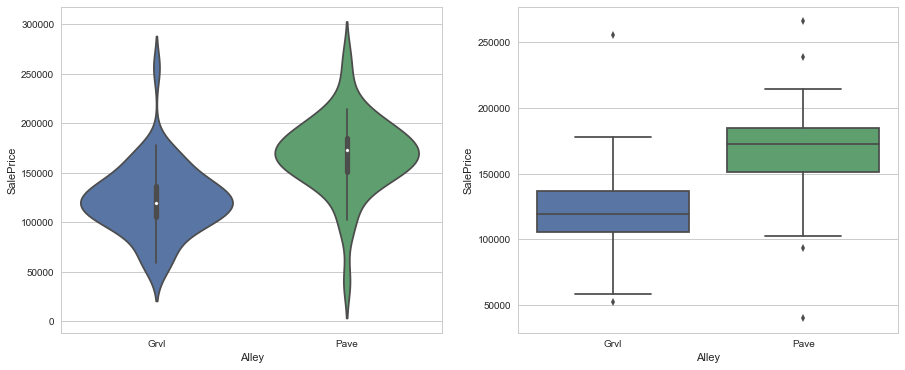

LotShape
  LotShape  Counts
0      IR1     484
1      IR2      41
2      IR3      10
3      Reg     925


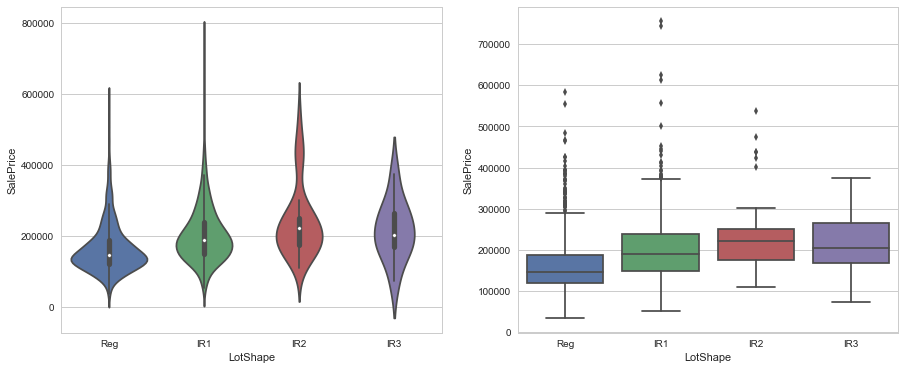

LandContour
  LandContour  Counts
0         Bnk      63
1         HLS      50
2         Low      36
3         Lvl    1311


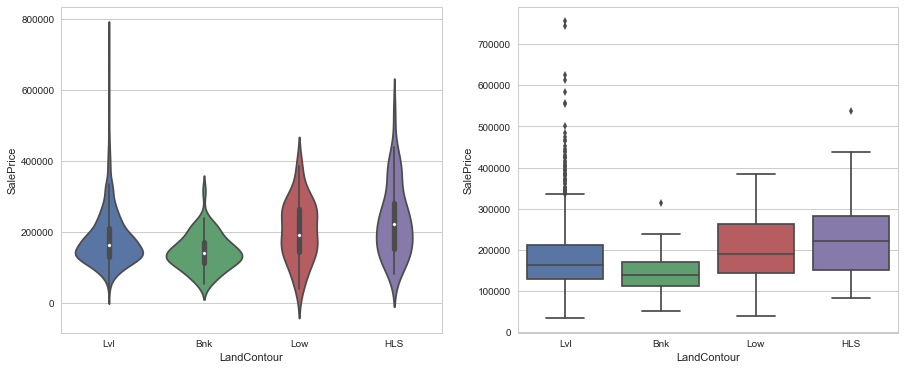

Utilities
  Utilities  Counts
0    AllPub    1459
1    NoSeWa       1


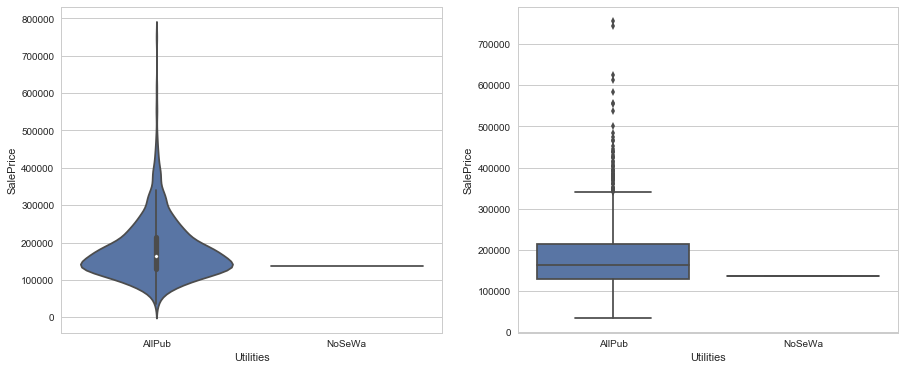

LotConfig
  LotConfig  Counts
0    Corner     263
1   CulDSac      94
2       FR2      47
3       FR3       4
4    Inside    1052


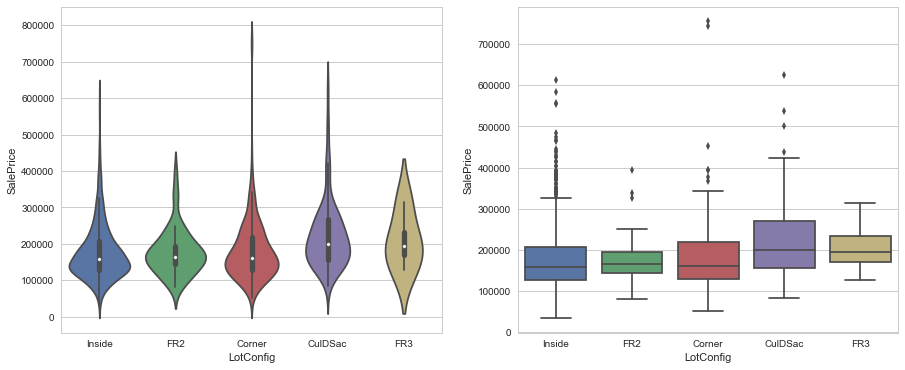

LandSlope
  LandSlope  Counts
0       Gtl    1382
1       Mod      65
2       Sev      13


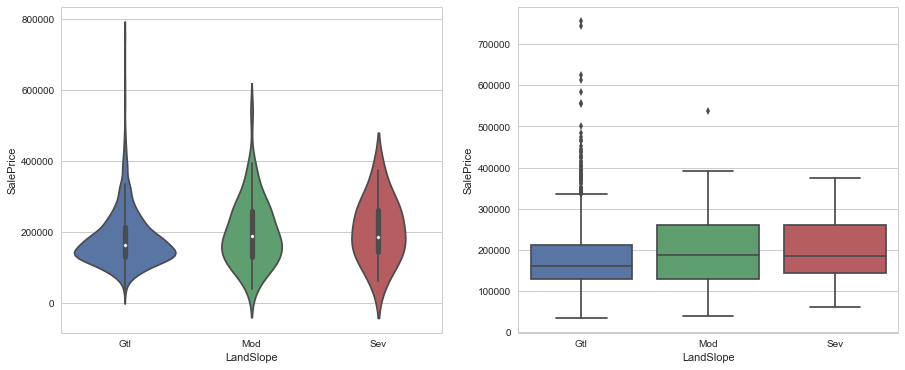

Neighborhood
   Neighborhood  Counts
0       Blmngtn      17
1       Blueste       2
2        BrDale      16
3       BrkSide      58
4       ClearCr      28
5       CollgCr     150
6       Crawfor      51
7       Edwards     100
8       Gilbert      79
9        IDOTRR      37
10      MeadowV      17
11      Mitchel      49
12        NAmes     225
13      NPkVill       9
14       NWAmes      73
15      NoRidge      41
16      NridgHt      77
17      OldTown     113
18        SWISU      25
19       Sawyer      74
20      SawyerW      59
21      Somerst      86
22      StoneBr      25
23       Timber      38
24      Veenker      11


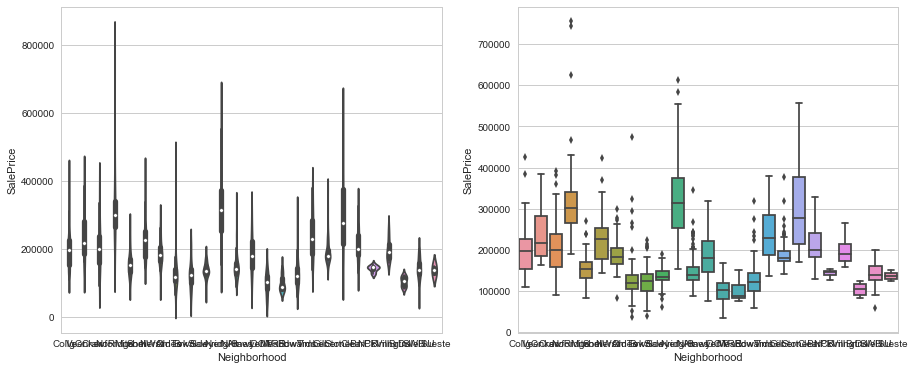

Condition1
  Condition1  Counts
0     Artery      48
1      Feedr      81
2       Norm    1260
3       PosA       8
4       PosN      19
5       RRAe      11
6       RRAn      26
7       RRNe       2
8       RRNn       5


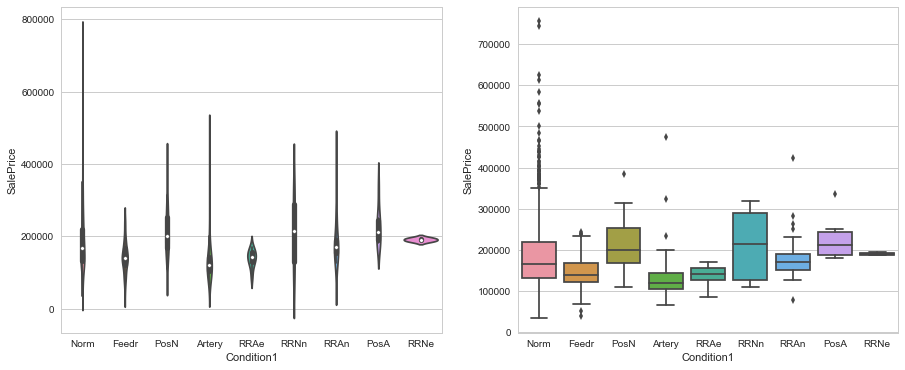

Condition2
  Condition2  Counts
0     Artery       2
1      Feedr       6
2       Norm    1445
3       PosA       1
4       PosN       2
5       RRAe       1
6       RRAn       1
7       RRNn       2


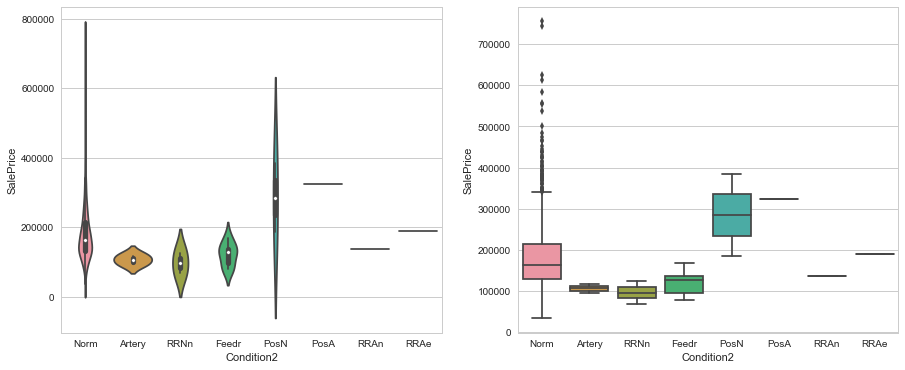

BldgType
  BldgType  Counts
0     1Fam    1220
1   2fmCon      31
2   Duplex      52
3    Twnhs      43
4   TwnhsE     114


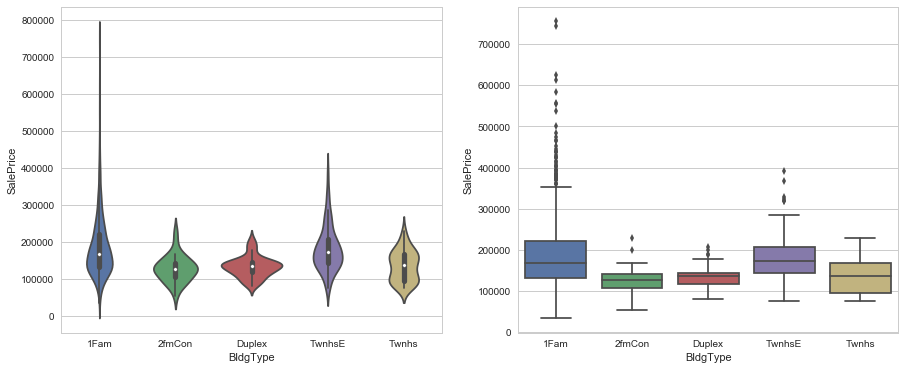

HouseStyle
  HouseStyle  Counts
0     1.5Fin     154
1     1.5Unf      14
2     1Story     726
3     2.5Fin       8
4     2.5Unf      11
5     2Story     445
6     SFoyer      37
7       SLvl      65


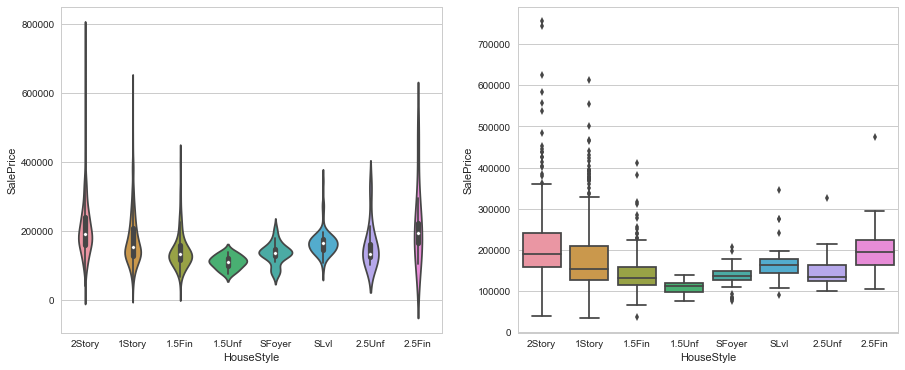

RoofStyle
  RoofStyle  Counts
0      Flat      13
1     Gable    1141
2   Gambrel      11
3       Hip     286
4   Mansard       7
5      Shed       2


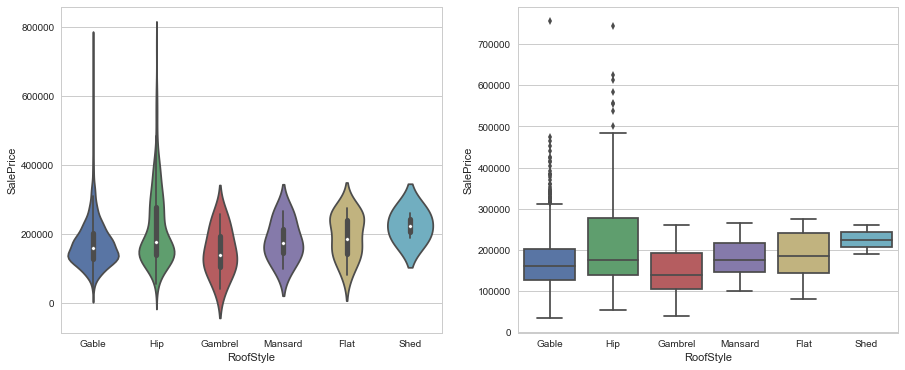

RoofMatl
  RoofMatl  Counts
0  ClyTile       1
1  CompShg    1434
2  Membran       1
3    Metal       1
4     Roll       1
5  Tar&Grv      11
6  WdShake       5
7  WdShngl       6


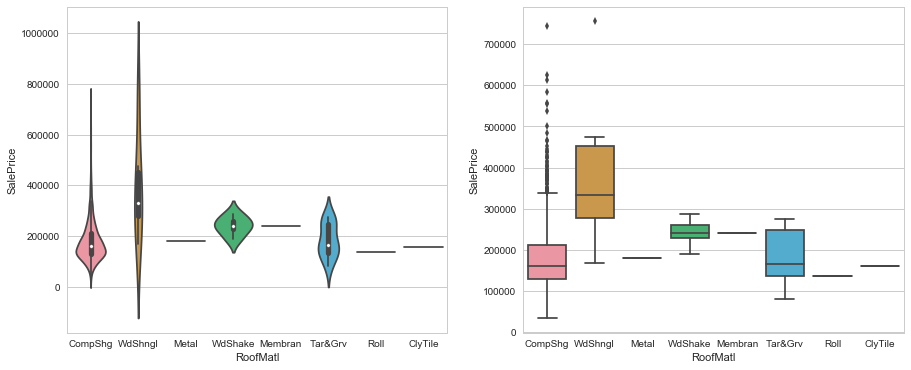

Exterior1st
   Exterior1st  Counts
0      AsbShng      20
1      AsphShn       1
2      BrkComm       2
3      BrkFace      50
4       CBlock       1
5      CemntBd      61
6      HdBoard     222
7      ImStucc       1
8      MetalSd     220
9      Plywood     108
10       Stone       2
11      Stucco      25
12     VinylSd     515
13     Wd Sdng     206
14     WdShing      26


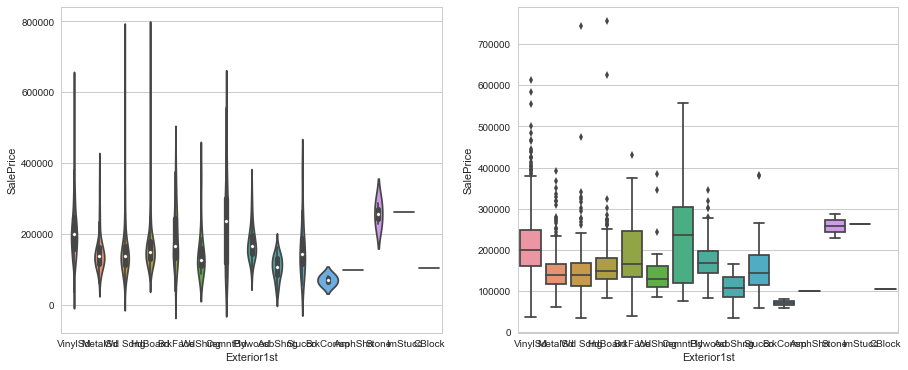

Exterior2nd
   Exterior2nd  Counts
0      AsbShng      20
1      AsphShn       3
2      Brk Cmn       7
3      BrkFace      25
4       CBlock       1
5      CmentBd      60
6      HdBoard     207
7      ImStucc      10
8      MetalSd     214
9        Other       1
10     Plywood     142
11       Stone       5
12      Stucco      26
13     VinylSd     504
14     Wd Sdng     197
15     Wd Shng      38


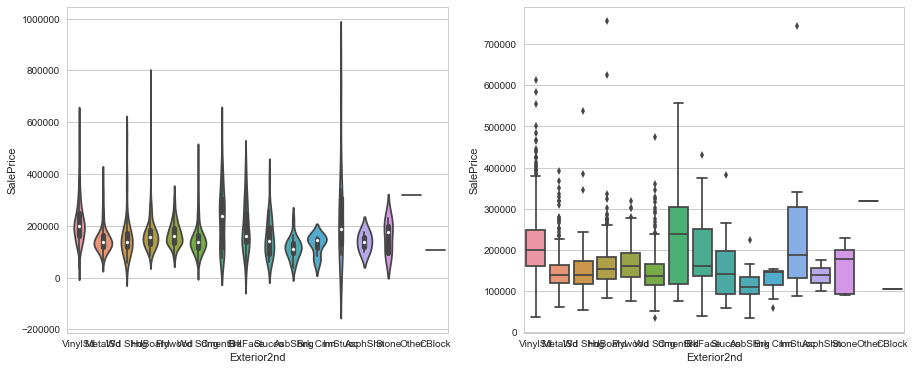

MasVnrType
  MasVnrType  Counts
0     BrkCmn      15
1    BrkFace     445
2       None     864
3      Stone     128


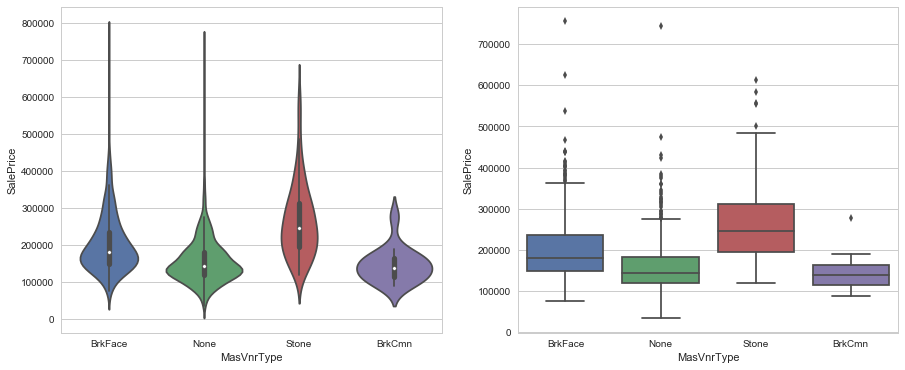

ExterQual
  ExterQual  Counts
0        Ex      52
1        Fa      14
2        Gd     488
3        TA     906


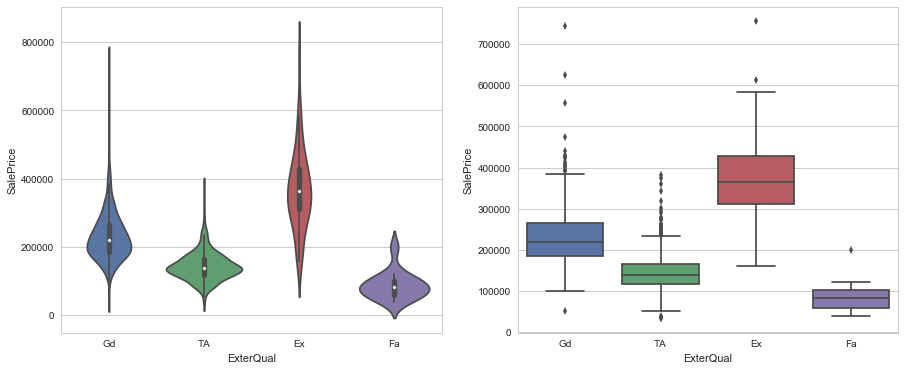

ExterCond
  ExterCond  Counts
0        Ex       3
1        Fa      28
2        Gd     146
3        Po       1
4        TA    1282


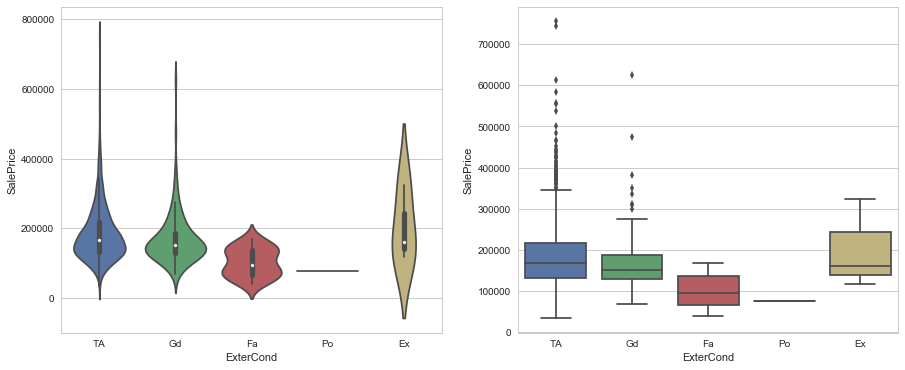

Foundation
  Foundation  Counts
0     BrkTil     146
1     CBlock     634
2      PConc     647
3       Slab      24
4      Stone       6
5       Wood       3


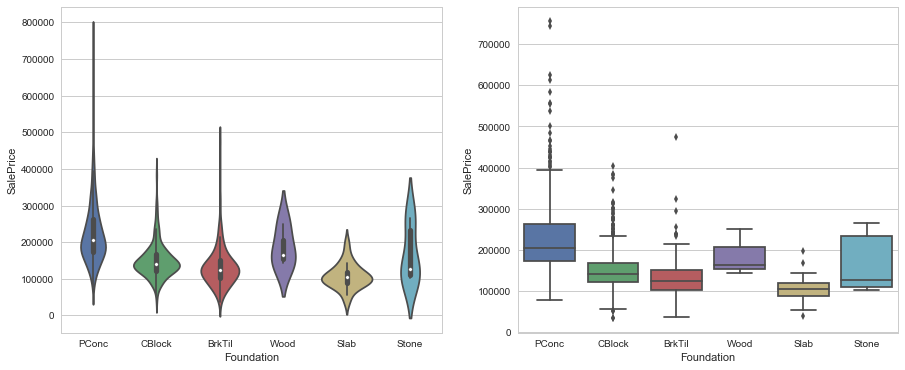

BsmtQual
  BsmtQual  Counts
0       Ex     121
1       Fa      35
2       Gd     618
3       TA     649


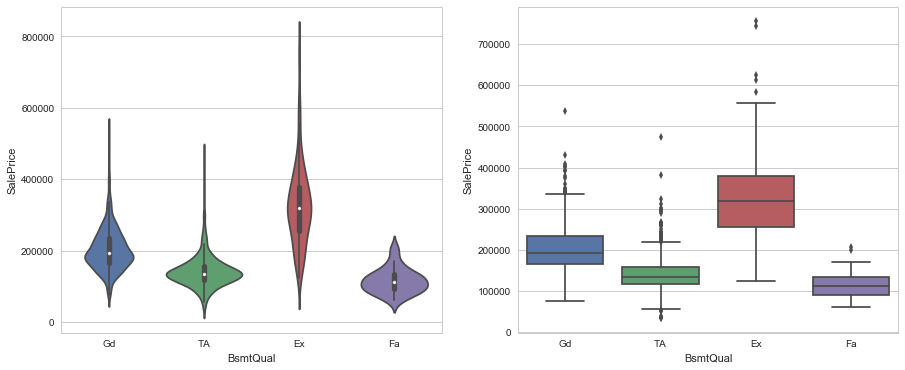

BsmtCond
  BsmtCond  Counts
0       Fa      45
1       Gd      65
2       Po       2
3       TA    1311


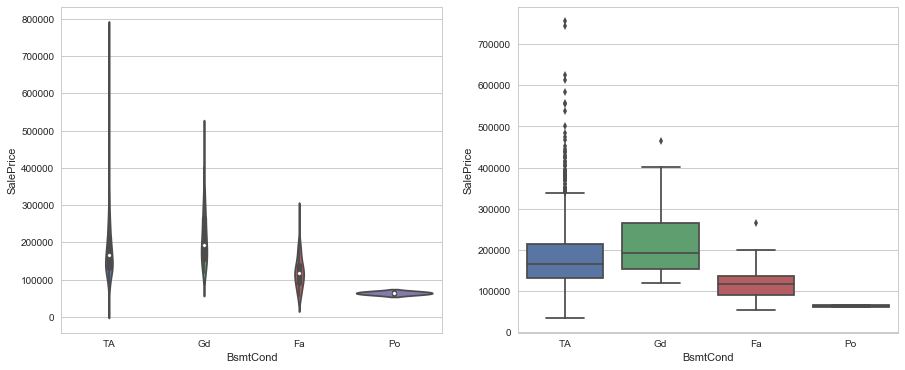

BsmtExposure
  BsmtExposure  Counts
0           Av     221
1           Gd     134
2           Mn     114
3           No     953


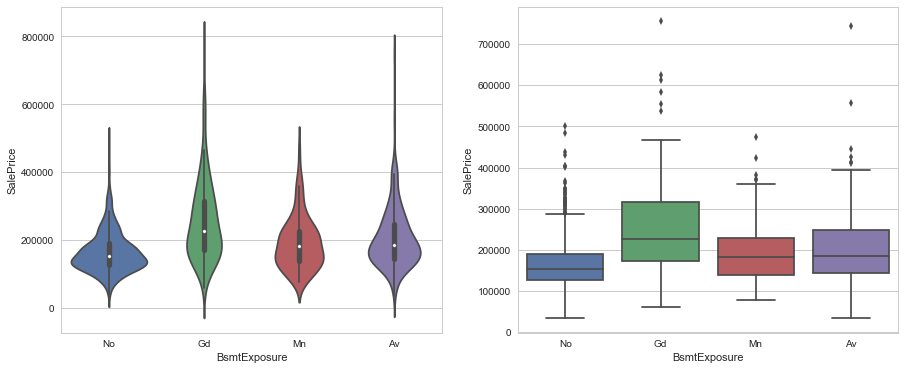

BsmtFinType1
  BsmtFinType1  Counts
0          ALQ     220
1          BLQ     148
2          GLQ     418
3          LwQ      74
4          Rec     133
5          Unf     430


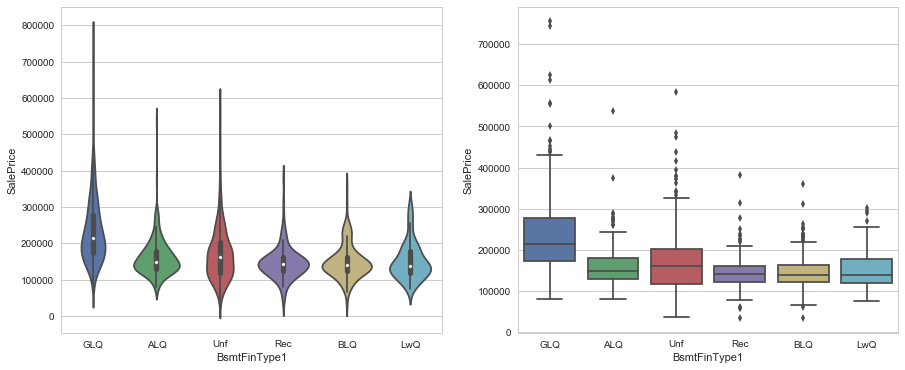

BsmtFinType2
  BsmtFinType2  Counts
0          ALQ      19
1          BLQ      33
2          GLQ      14
3          LwQ      46
4          Rec      54
5          Unf    1256


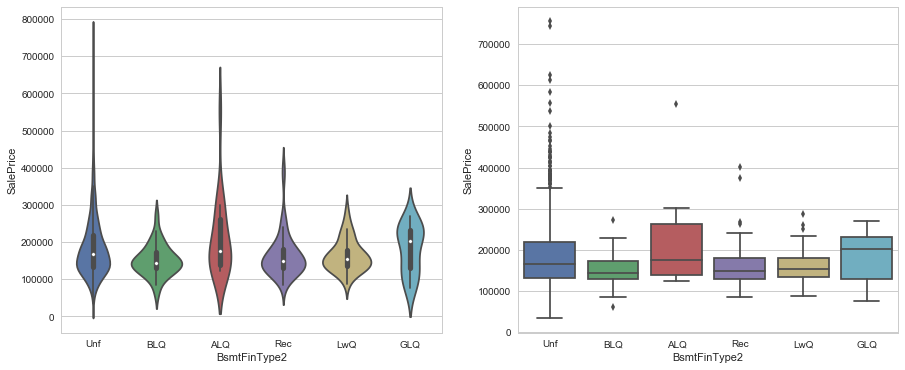

Heating
  Heating  Counts
0   Floor       1
1    GasA    1428
2    GasW      18
3    Grav       7
4    OthW       2
5    Wall       4


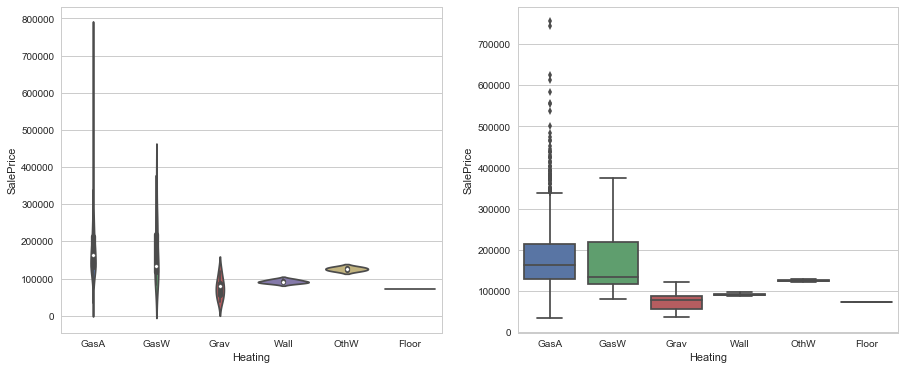

HeatingQC
  HeatingQC  Counts
0        Ex     741
1        Fa      49
2        Gd     241
3        Po       1
4        TA     428


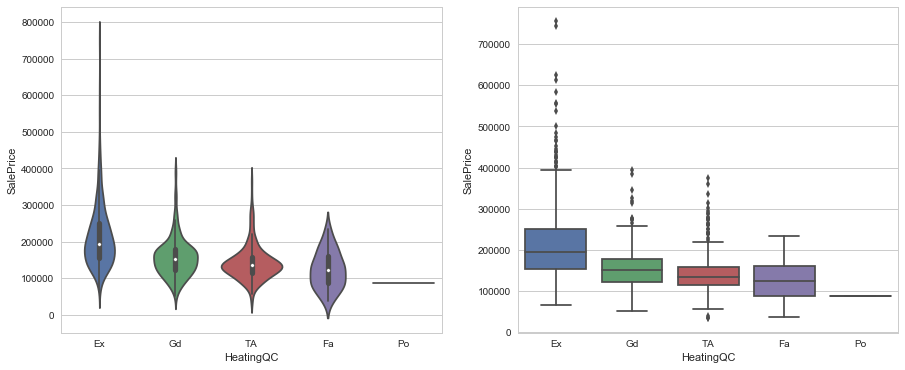

CentralAir
  CentralAir  Counts
0          N      95
1          Y    1365


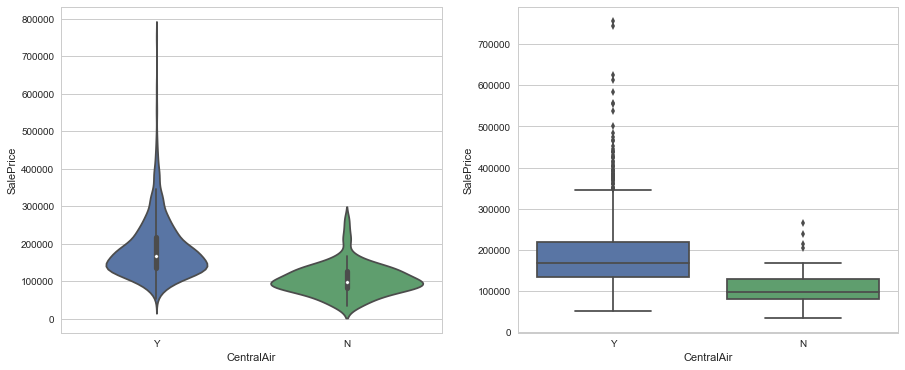

Electrical
  Electrical  Counts
0      FuseA      94
1      FuseF      27
2      FuseP       3
3        Mix       1
4      SBrkr    1334


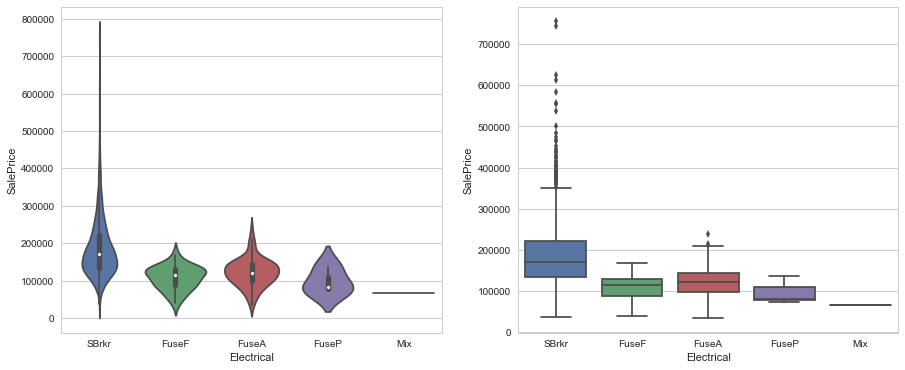

KitchenQual
  KitchenQual  Counts
0          Ex     100
1          Fa      39
2          Gd     586
3          TA     735


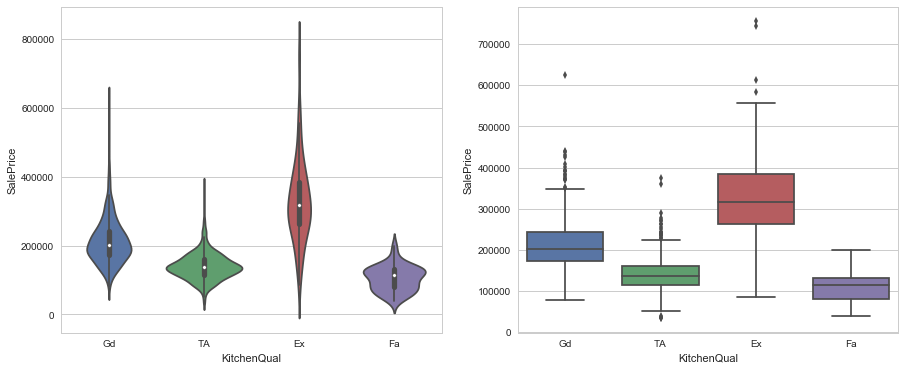

Functional
  Functional  Counts
0       Maj1      14
1       Maj2       5
2       Min1      31
3       Min2      34
4        Mod      15
5        Sev       1
6        Typ    1360


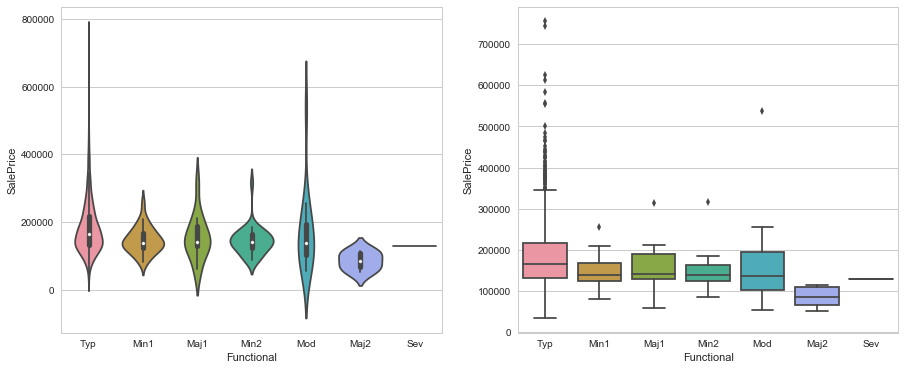

FireplaceQu
  FireplaceQu  Counts
0          Ex      24
1          Fa      33
2          Gd     380
3          Po      20
4          TA     313


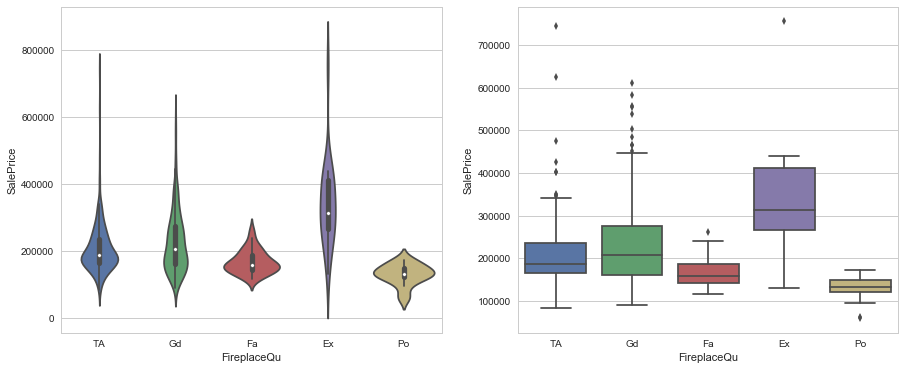

GarageType
  GarageType  Counts
0     2Types       6
1     Attchd     870
2    Basment      19
3    BuiltIn      88
4    CarPort       9
5     Detchd     387


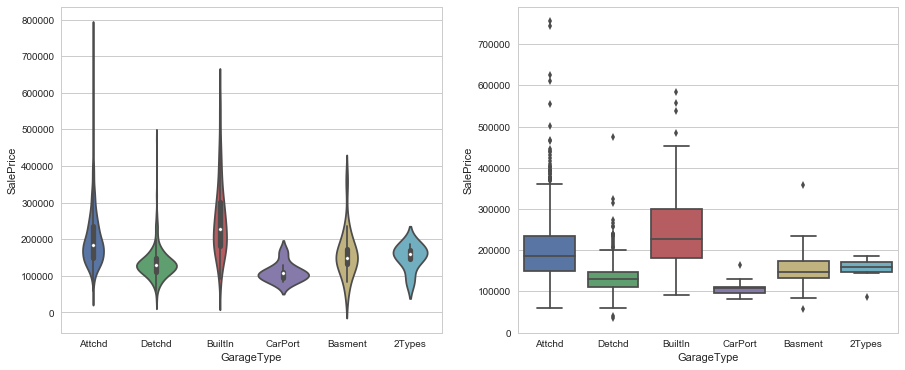

GarageFinish
  GarageFinish  Counts
0          Fin     352
1          RFn     422
2          Unf     605


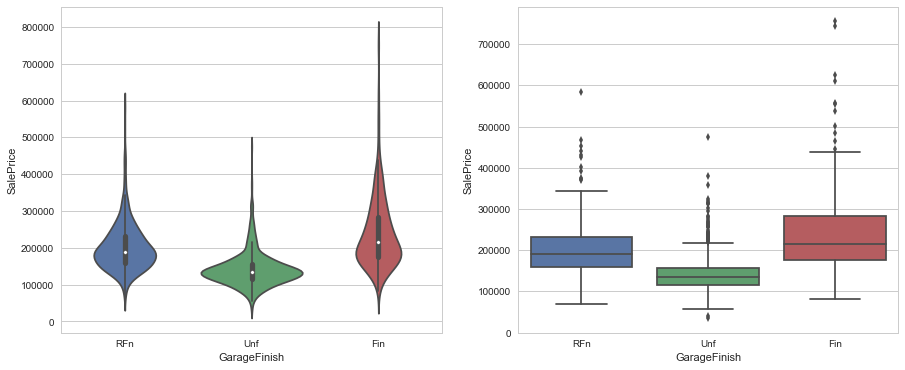

GarageQual
  GarageQual  Counts
0         Ex       3
1         Fa      48
2         Gd      14
3         Po       3
4         TA    1311


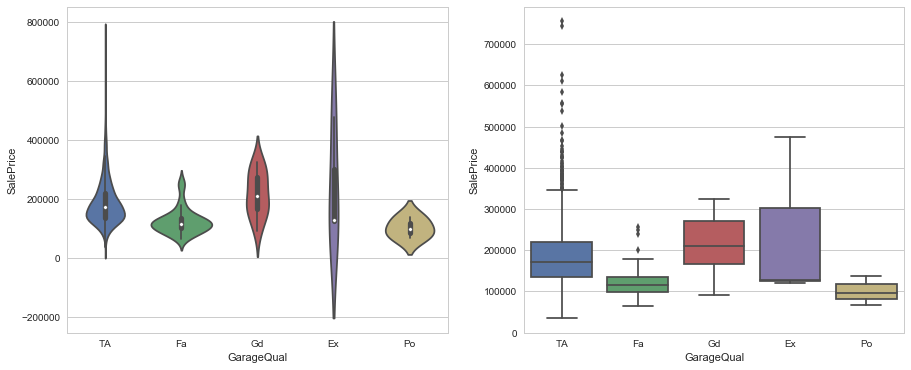

GarageCond
  GarageCond  Counts
0         Ex       2
1         Fa      35
2         Gd       9
3         Po       7
4         TA    1326


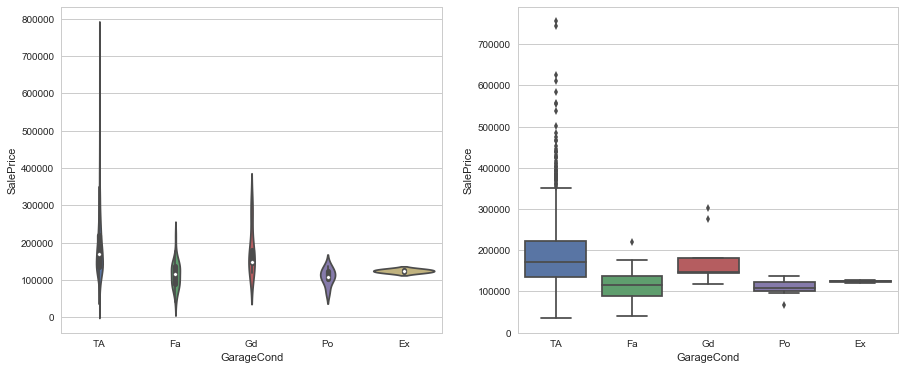

PavedDrive
  PavedDrive  Counts
0          N      90
1          P      30
2          Y    1340


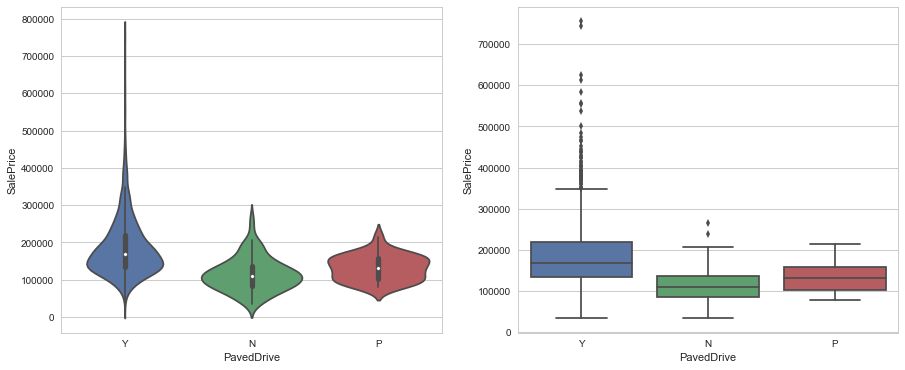

PoolQC
  PoolQC  Counts
0     Ex       2
1     Fa       2
2     Gd       3


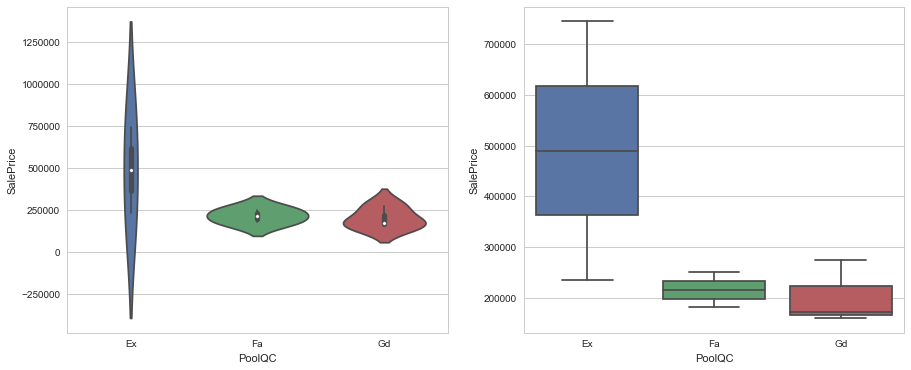

Fence
   Fence  Counts
0  GdPrv      59
1   GdWo      54
2  MnPrv     157
3   MnWw      11


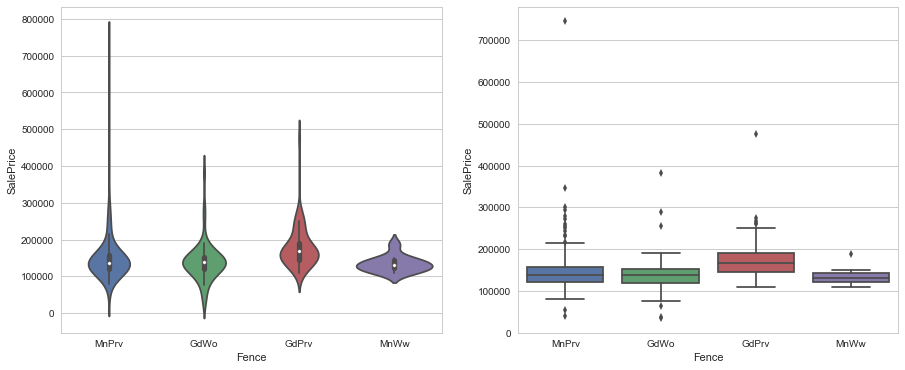

MiscFeature
  MiscFeature  Counts
0        Gar2       2
1        Othr       2
2        Shed      49
3        TenC       1


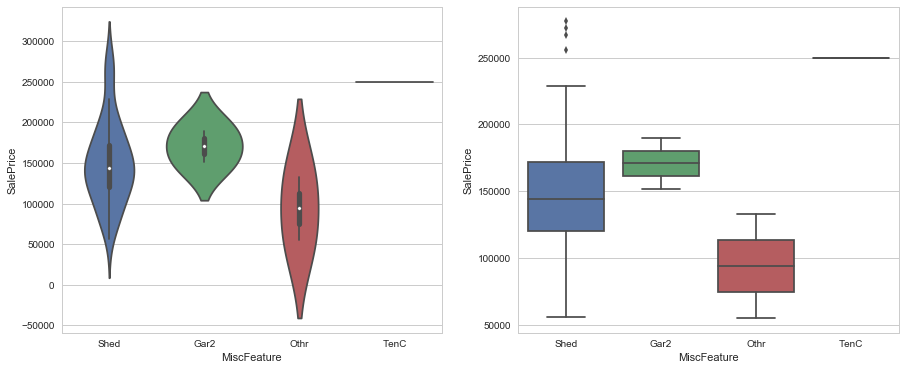

SaleType
  SaleType  Counts
0      COD      43
1      CWD       4
2      Con       2
3    ConLD       9
4    ConLI       5
5    ConLw       5
6      New     122
7      Oth       3
8       WD    1267


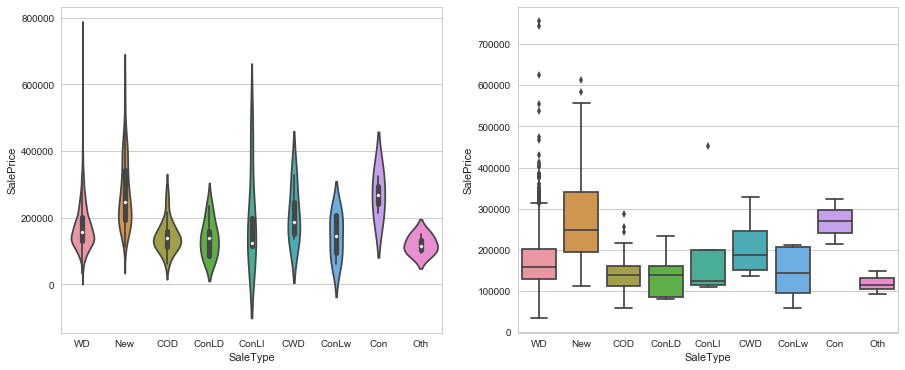

SaleCondition
  SaleCondition  Counts
0       Abnorml     101
1       AdjLand       4
2        Alloca      12
3        Family      20
4        Normal    1198
5       Partial     125


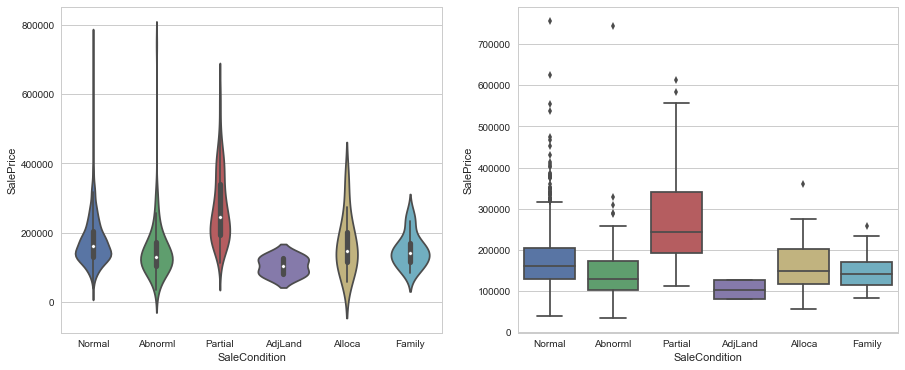

In [14]:
# 숫자 부여 전
col_names = df_str.columns

plt.rcParams["figure.figsize"] = (15,6)
for col_name in col_names[:-1]:
    show_viobox(df_str, col_name)

MSZoningGrade
   MSZoningGrade  Counts
0              1      10
1              2     218
2              3      16
3              4    1151
4              5      65


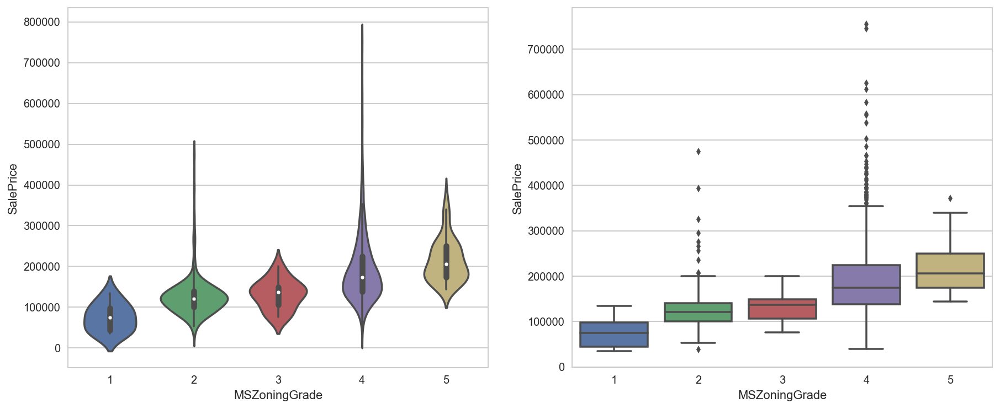

StreetGrade
   StreetGrade  Counts
0            1       6
1            2    1454


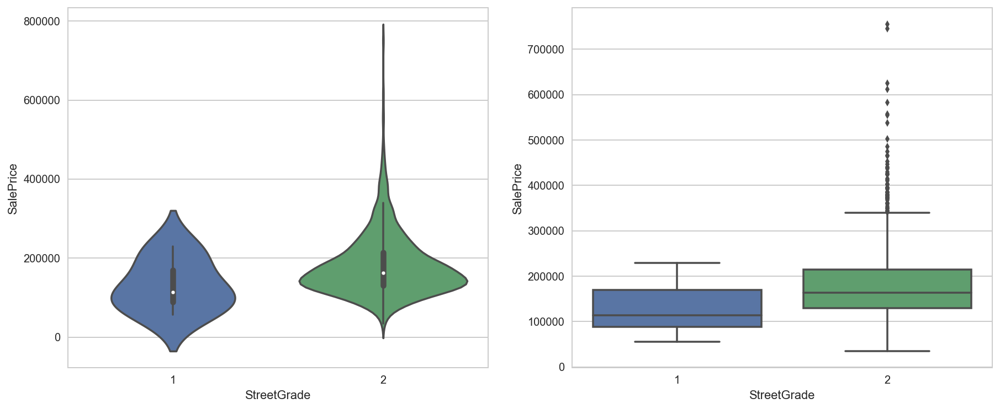

AlleyGrade
   AlleyGrade  Counts
0         1.0      50
1         2.0      41


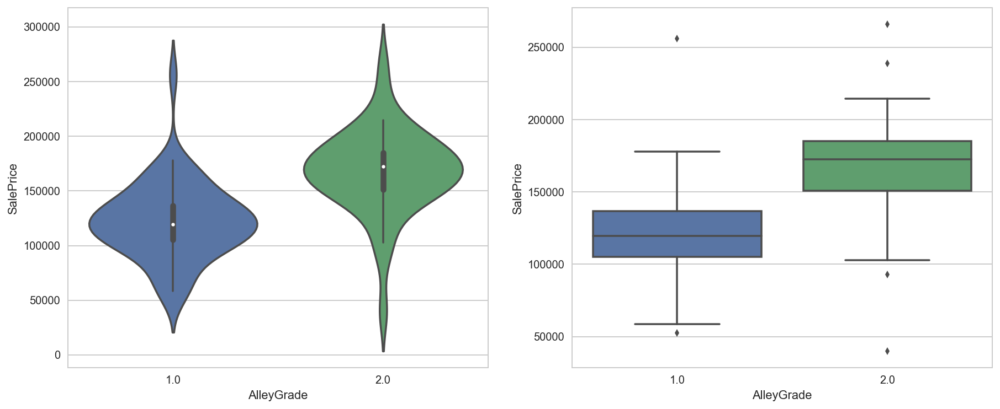

LotShapeGrade
   LotShapeGrade  Counts
0              1     925
1              2     484
2              3      10
3              4      41


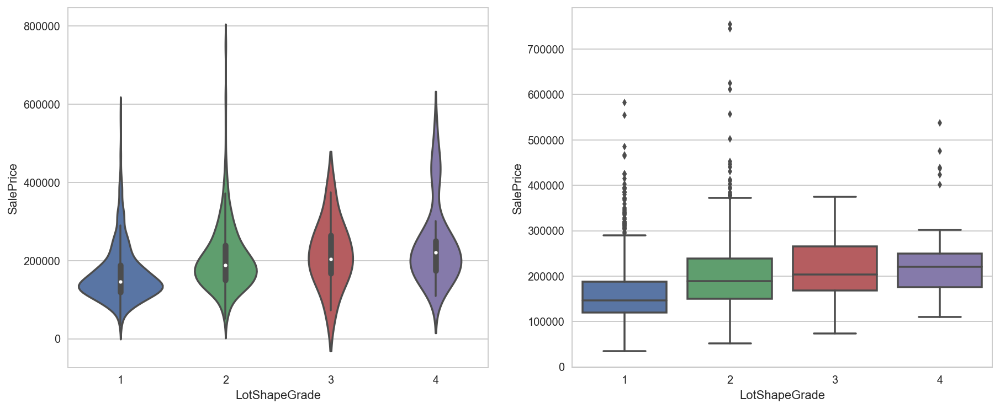

LandContourGrade
   LandContourGrade  Counts
0                 1      63
1                 2    1311
2                 3      36
3                 4      50


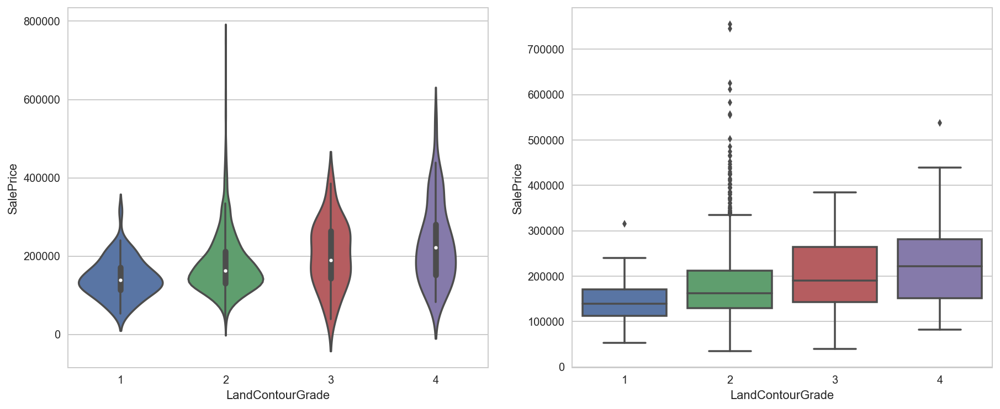

UtilitiesGrade
   UtilitiesGrade  Counts
0               1       1
1               2    1459


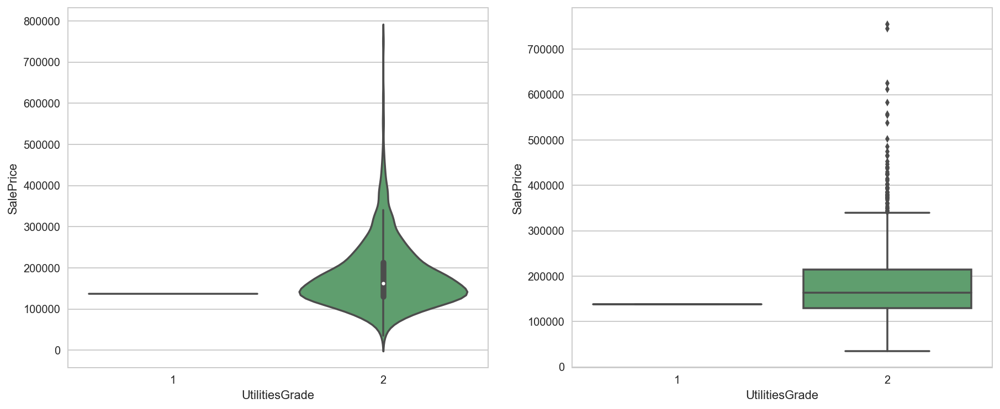

LotConfigGrade
   LotConfigGrade  Counts
0               1    1052
1               2     263
2               3      47
3               4       4
4               5      94


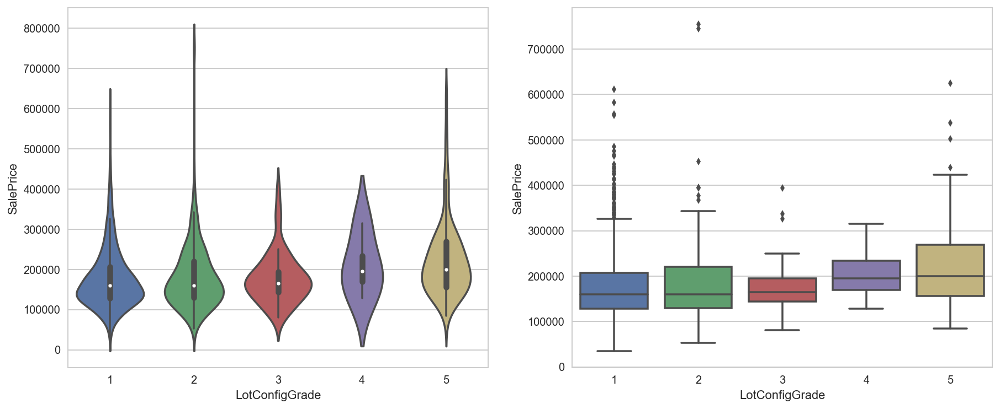

LandSlopeGrade
   LandSlopeGrade  Counts
0               1    1382
1               2      13
2               3      65


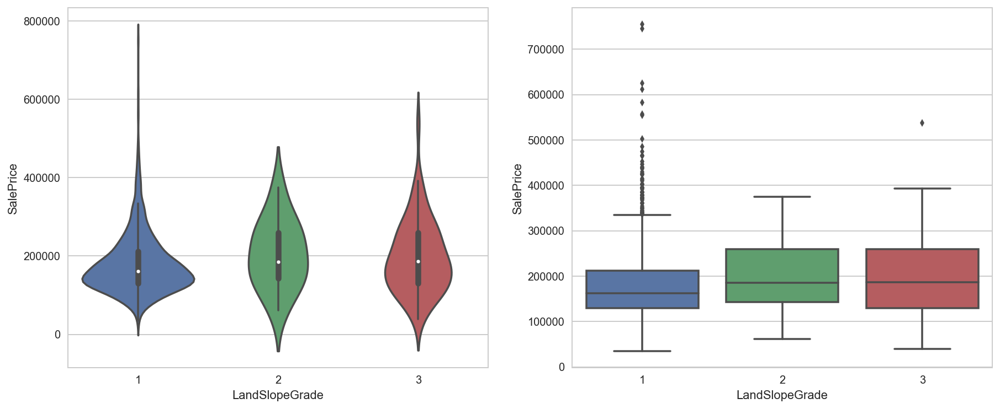

NeighborhoodGrade
    NeighborhoodGrade  Counts
0                   1      17
1                   2      37
2                   3      16
3                   4     113
4                   5     100
5                   6      58
6                   7      74
7                   8       2
8                   9      25
9                  10     225
10                 11       9
11                 12      49
12                 13      59
13                 14      79
14                 15      73
15                 16      17
16                 17     150
17                 18      28
18                 19      51
19                 20      11
20                 21      86
21                 22      38
22                 23      25
23                 24      41
24                 25      77


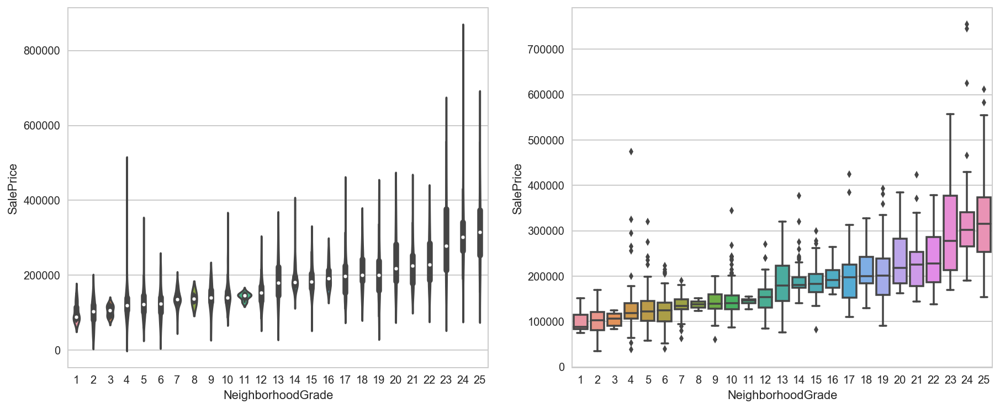

Condition1Grade
   Condition1Grade  Counts
0                1      48
1                2      81
2                3      11
3                4    1260
4                5      26
5                6       2
6                7      19
7                8       8
8                9       5


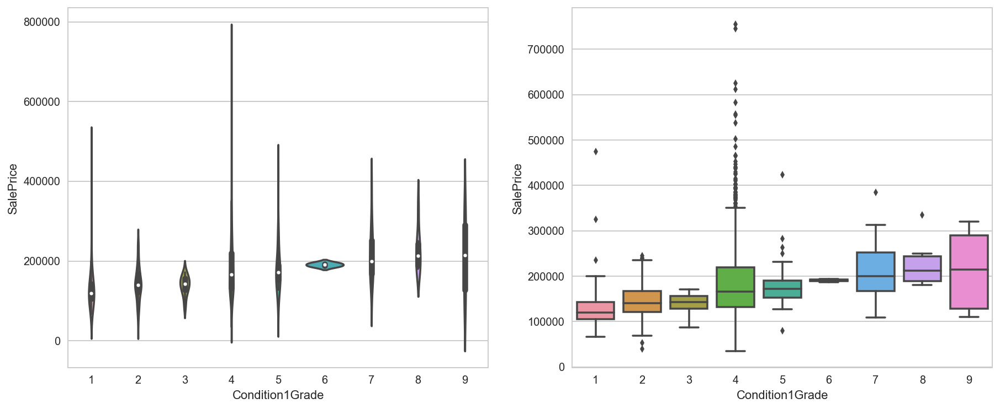

Condition2Grade
   Condition2Grade  Counts
0                1       2
1                2       2
2                3       6
3                4       1
4                5    1445
5                6       1
6                7       2
7                8       1


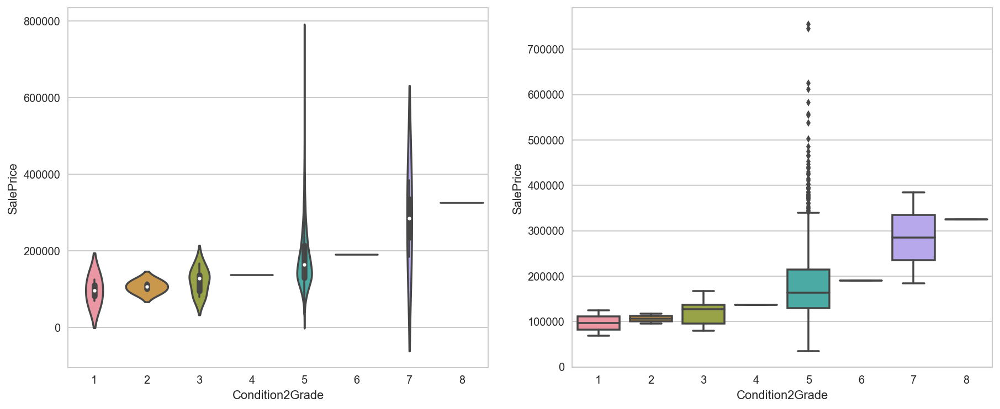

BldgTypeGrade
   BldgTypeGrade  Counts
0              1      31
1              2      52
2              3      43
3              4    1220
4              5     114


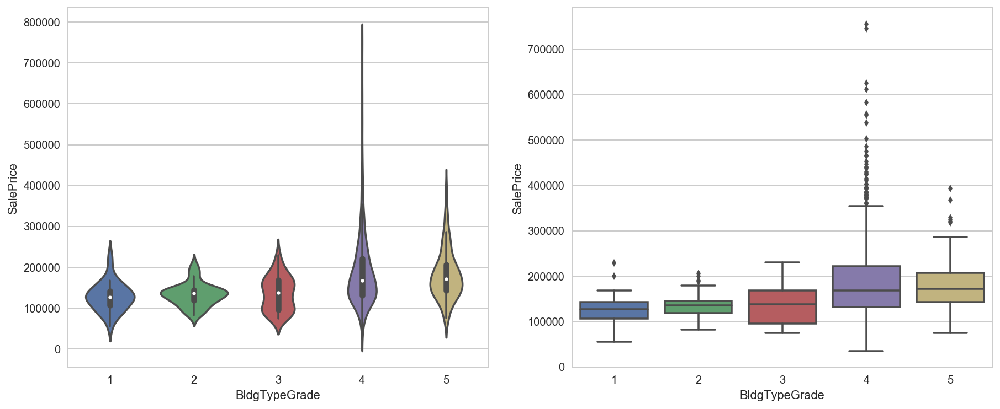

HouseStyleGrade
   HouseStyleGrade  Counts
0                1      14
1                2     154
2                3      11
3                4      37
4                5     726
5                6      65
6                7     445
7                8       8


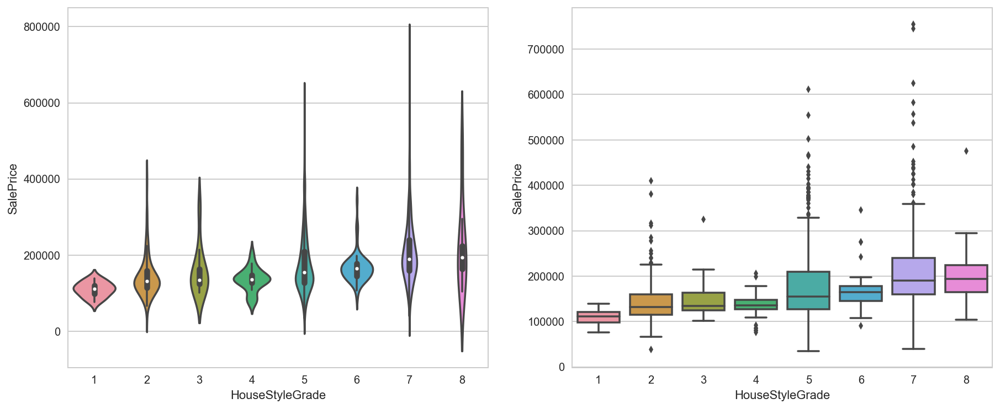

RoofStyleGrade
   RoofStyleGrade  Counts
0               1      11
1               2    1141
2               3       7
3               4     286
4               5      13
5               6       2


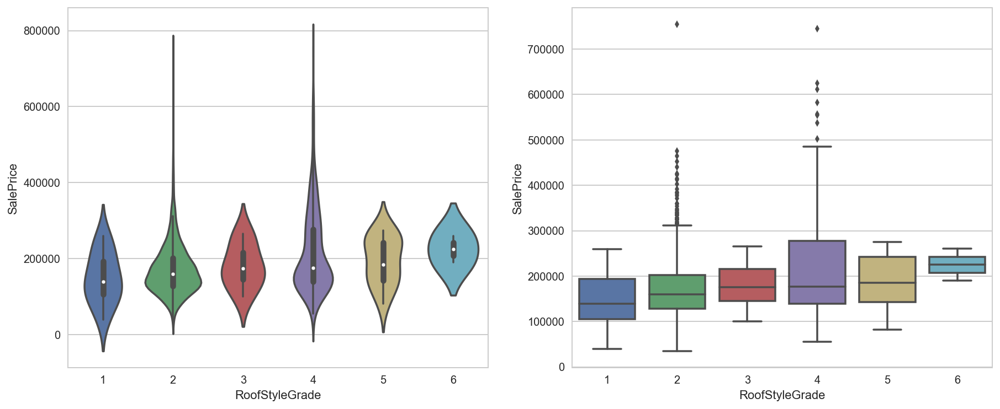

RoofMatlGrade
   RoofMatlGrade  Counts
0              1       1
1              2       1
2              3    1434
3              4      11
4              5       1
5              6       1
6              7       5
7              8       6


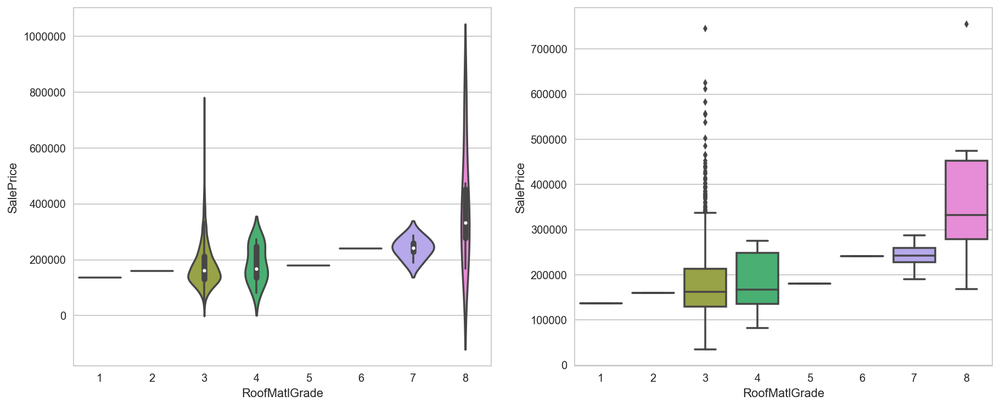

Exterior1stGrade
    Exterior1stGrade  Counts
0                  1       2
1                  2       1
2                  3       1
3                  4      20
4                  5      26
5                  6     206
6                  7     220
7                  8      25
8                  9     222
9                 10      50
10                11     108
11                12     515
12                13      61
13                14       2
14                15       1


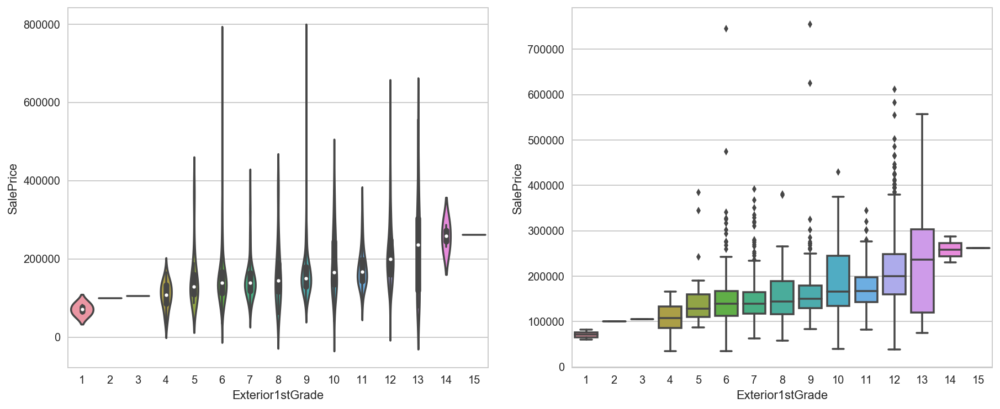

Exterior2ndGrade
    Exterior2ndGrade  Counts
0                  1       1
1                  2      20
2                  3     197
3                  4      38
4                  5     214
5                  6       3
6                  7      26
7                  8       7
8                  9     207
9                 10      25
10                11     142
11                12       5
12                13      10
13                14     504
14                15      60
15                16       1


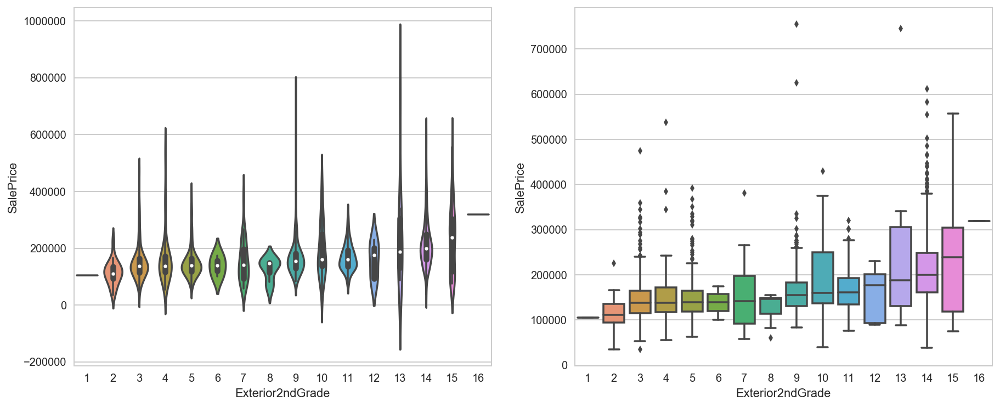

MasVnrTypeGrade
   MasVnrTypeGrade  Counts
0              1.0      15
1              2.0     864
2              3.0     445
3              4.0     128


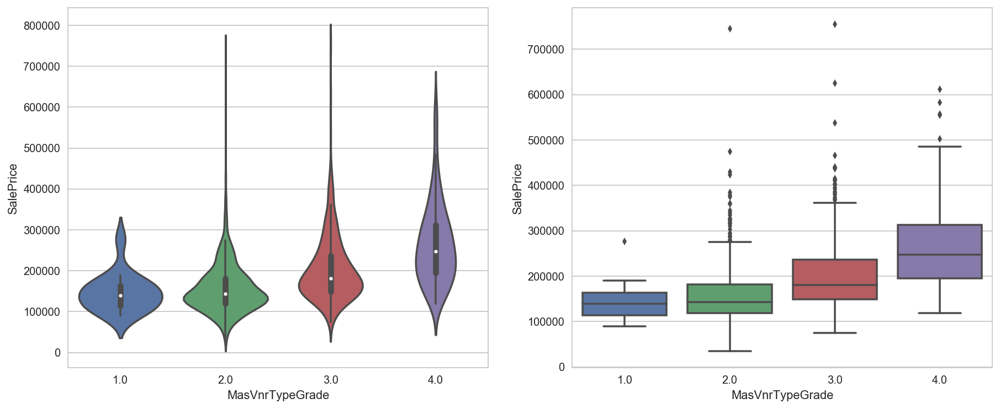

ExterQualGrade
   ExterQualGrade  Counts
0               1      14
1               2     906
2               3     488
3               4      52


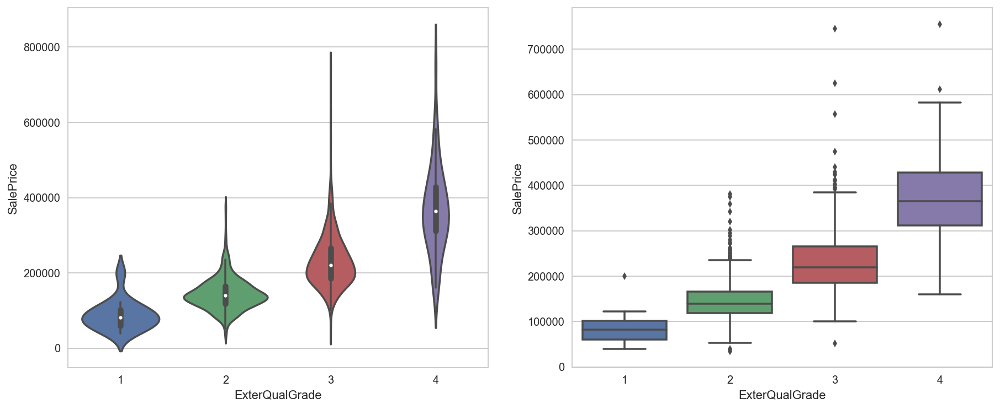

ExterCondGrade
   ExterCondGrade  Counts
0               1       1
1               2      28
2               3     146
3               4       3
4               5    1282


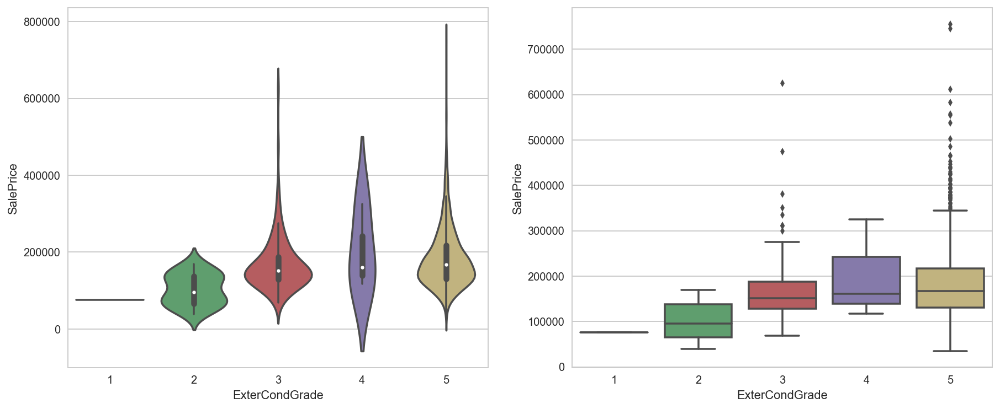

FoundationGrade
   FoundationGrade  Counts
0                1      24
1                2     146
2                3       6
3                4     634
4                5       3
5                6     647


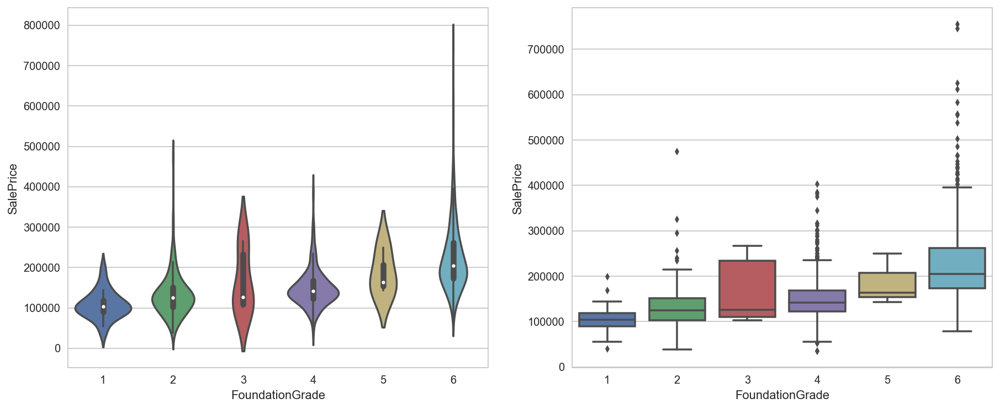

BsmtQualGrade
   BsmtQualGrade  Counts
0            1.0      35
1            2.0     649
2            3.0     618
3            4.0     121


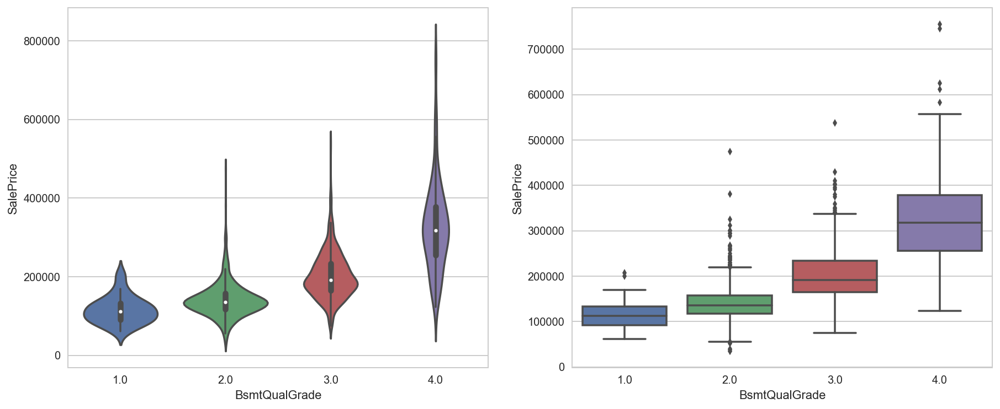

BsmtCondGrade
   BsmtCondGrade  Counts
0            1.0       2
1            2.0      45
2            3.0    1311
3            4.0      65


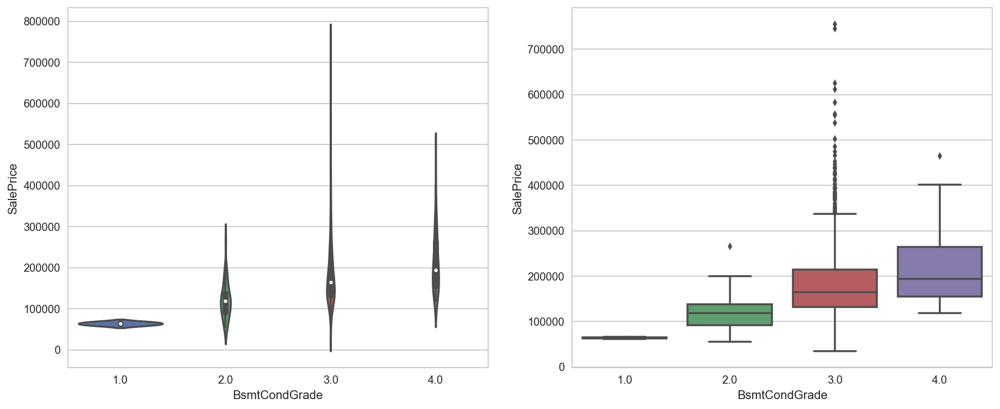

BsmtExposureGrade
   BsmtExposureGrade  Counts
0                1.0     953
1                2.0     114
2                3.0     221
3                4.0     134


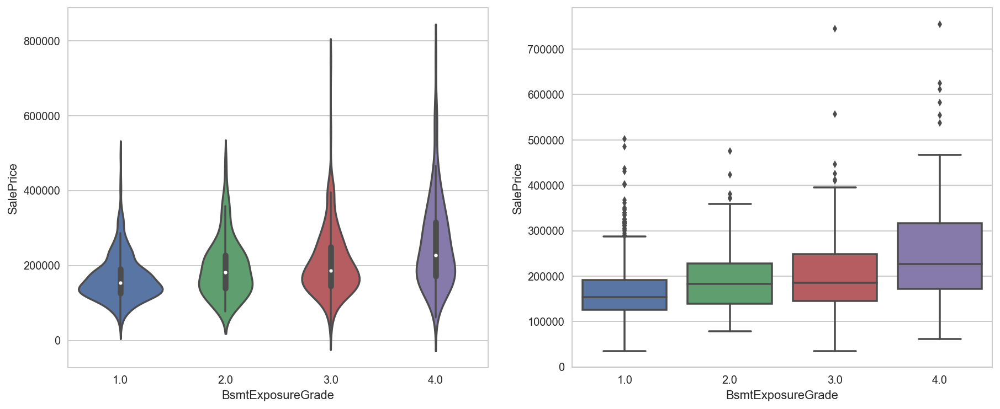

BsmtFinType1Grade
   BsmtFinType1Grade  Counts
0                1.0      74
1                2.0     148
2                3.0     133
3                4.0     220
4                5.0     430
5                6.0     418


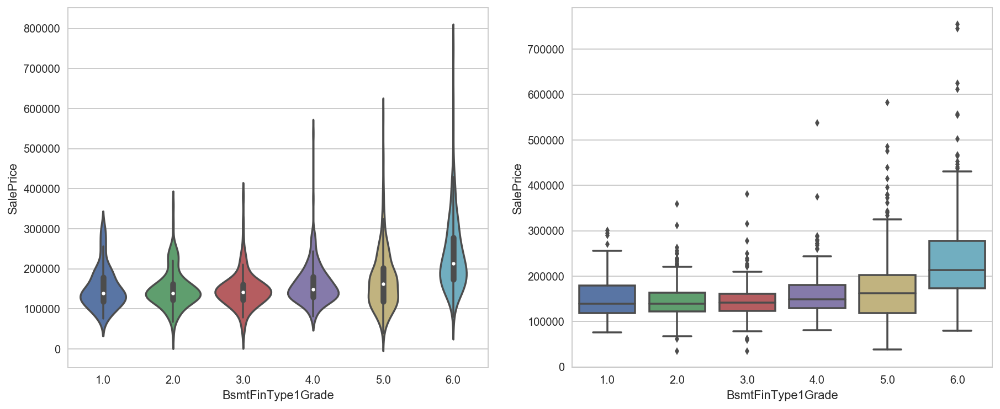

BsmtFinType2Grade
   BsmtFinType2Grade  Counts
0                1.0      33
1                2.0      54
2                3.0      46
3                4.0    1256
4                5.0      19
5                6.0      14


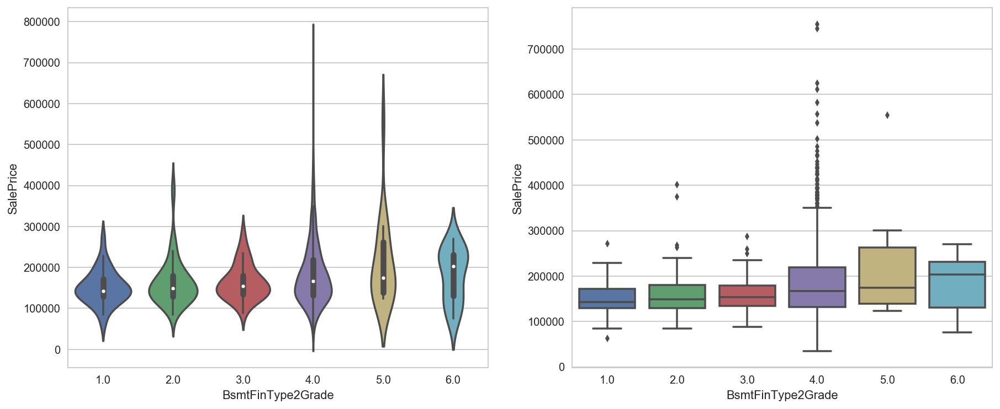

HeatingGrade
   HeatingGrade  Counts
0             1       1
1             2       7
2             3       4
3             4       2
4             5      18
5             6    1428


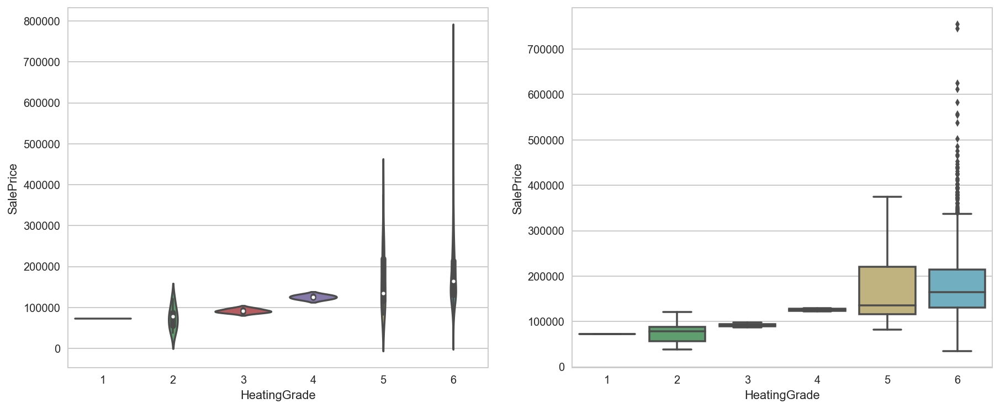

HeatingQCGrade
   HeatingQCGrade  Counts
0               1       1
1               2      49
2               3     428
3               4     241
4               5     741


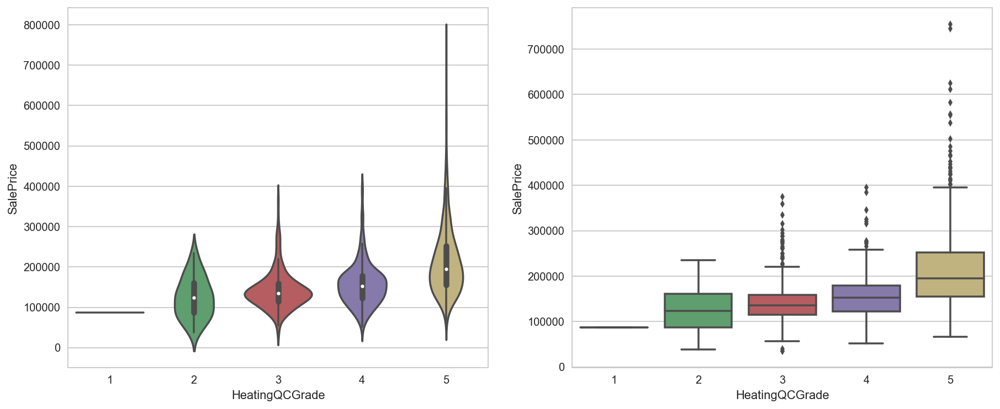

CentralAirGrade
   CentralAirGrade  Counts
0                1      95
1                2    1365


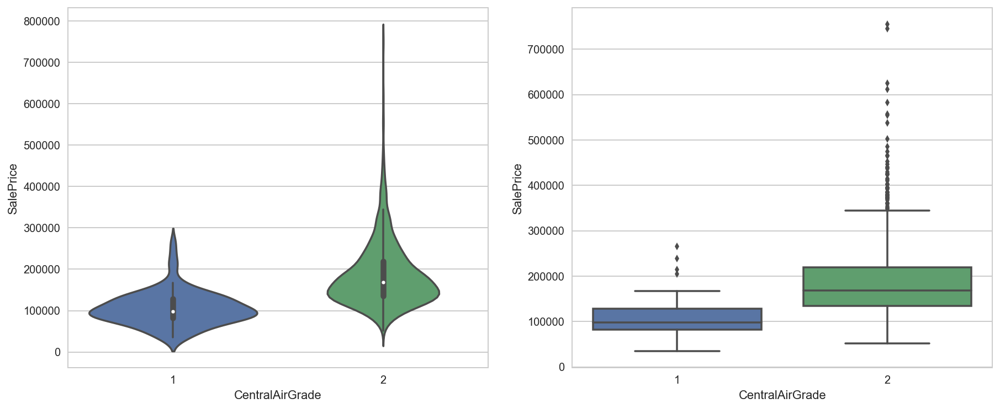

ElectricalGrade
   ElectricalGrade  Counts
0              1.0       1
1              2.0       3
2              3.0      27
3              4.0      94
4              5.0    1334


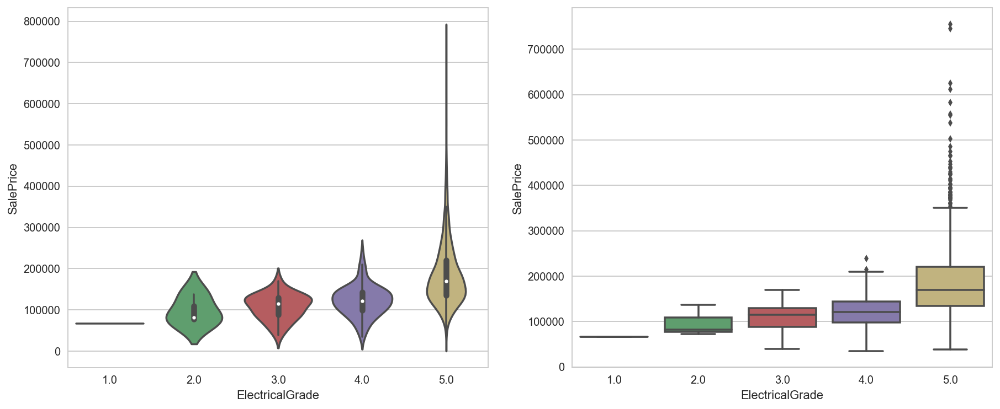

KitchenQualGrade
   KitchenQualGrade  Counts
0                 1      39
1                 2     735
2                 3     586
3                 4     100


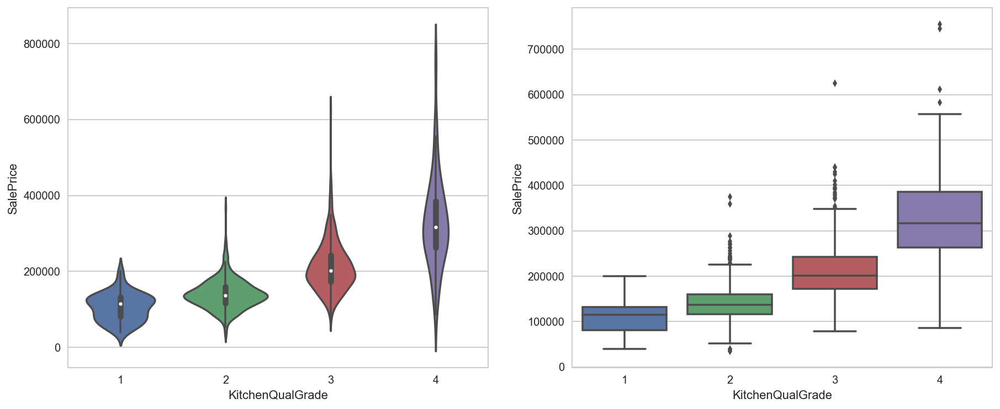

FunctionalGrade
   FunctionalGrade  Counts
0                1       5
1                2       1
2                3      15
3                4      31
4                5      34
5                6      14
6                7    1360


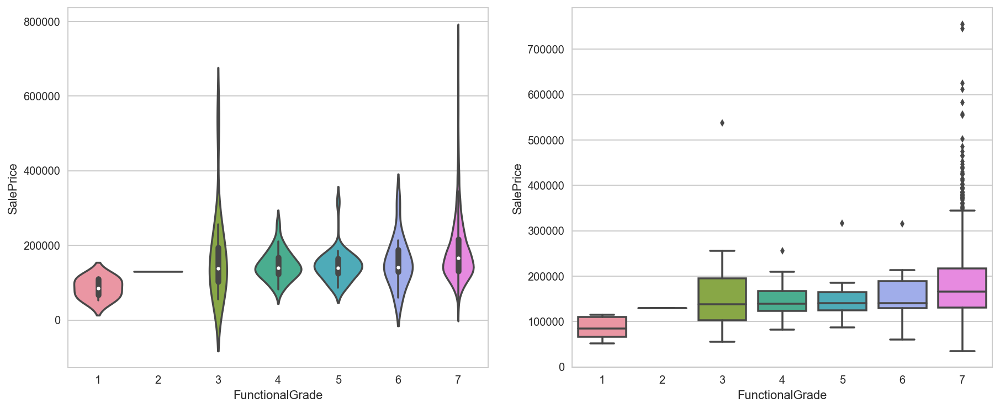

FireplaceQuGrade
   FireplaceQuGrade  Counts
0               1.0      20
1               2.0      33
2               3.0     313
3               4.0     380
4               5.0      24


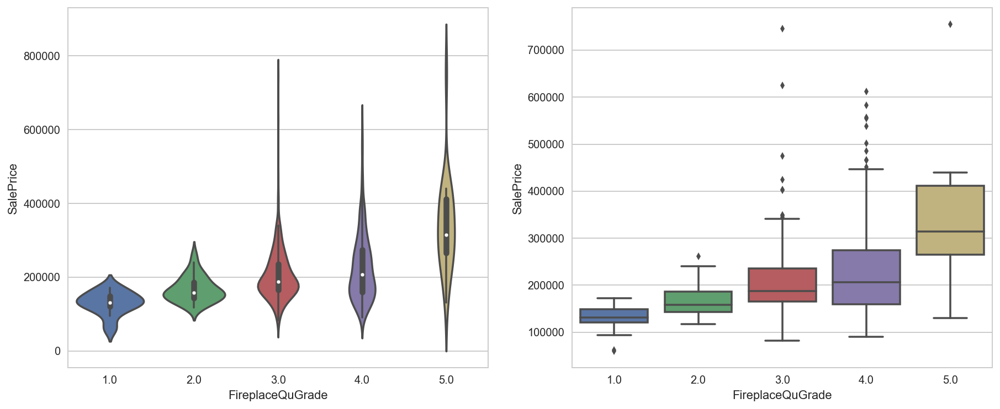

GarageTypeGrade
   GarageTypeGrade  Counts
0              1.0       9
1              2.0     387
2              3.0      19
3              4.0       6
4              5.0     870
5              6.0      88


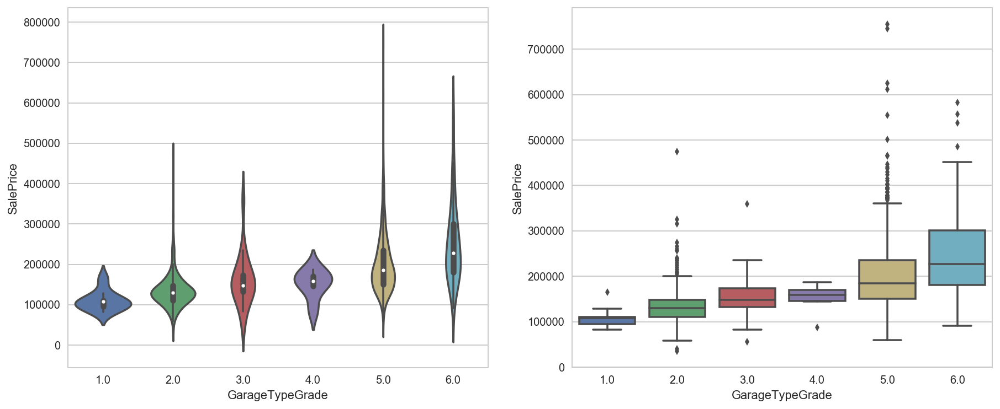

GarageFinishGrade
   GarageFinishGrade  Counts
0                1.0     605
1                2.0     422
2                3.0     352


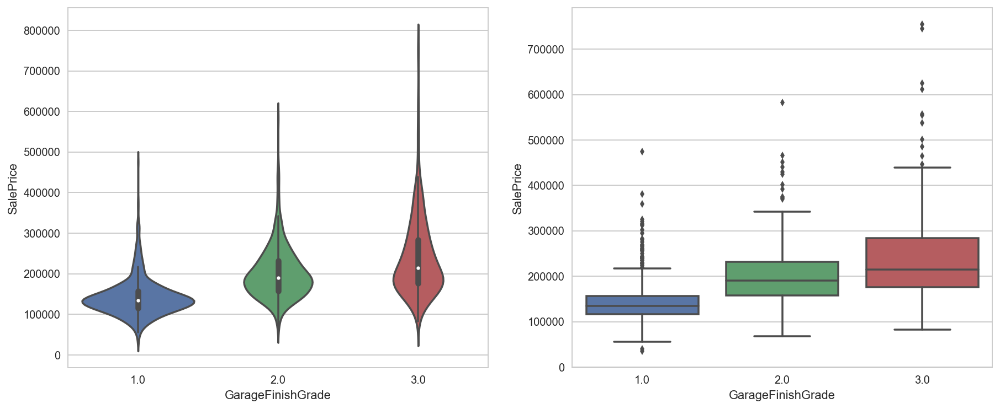

GarageQualGrade
   GarageQualGrade  Counts
0              1.0       3
1              2.0      48
2              3.0       3
3              4.0    1311
4              5.0      14


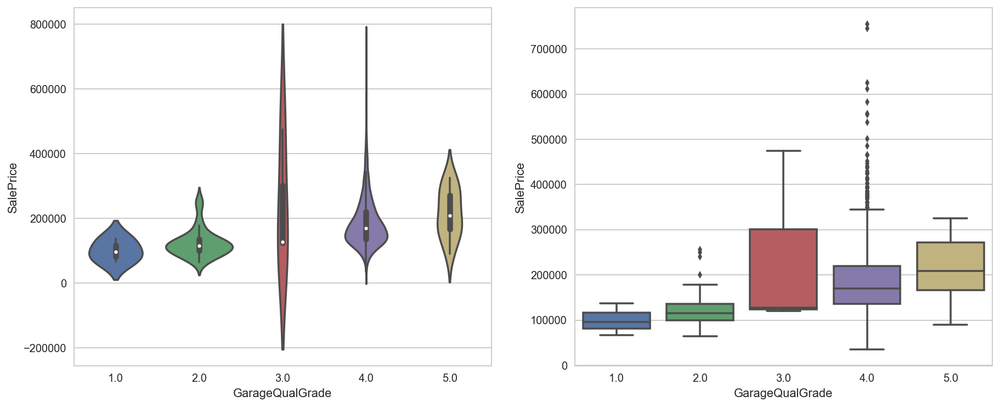

GarageCondGrade
   GarageCondGrade  Counts
0              1.0       7
1              2.0      35
2              3.0       2
3              4.0       9
4              5.0    1326


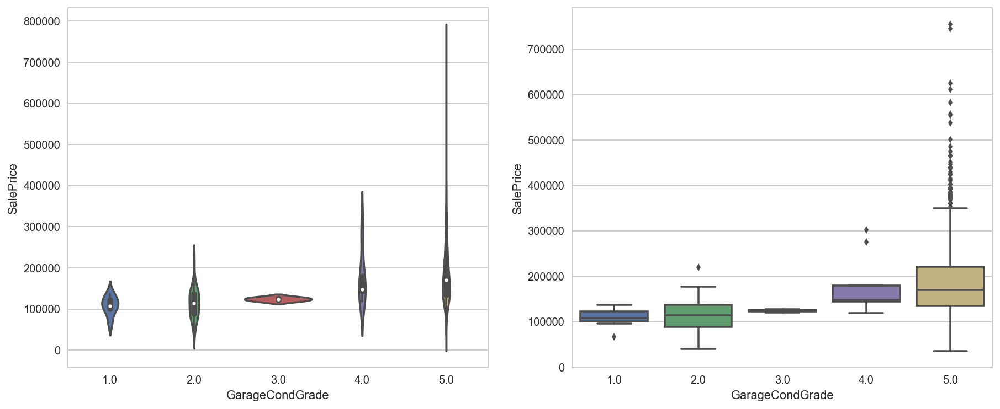

PavedDriveGrade
   PavedDriveGrade  Counts
0                1      90
1                2      30
2                3    1340


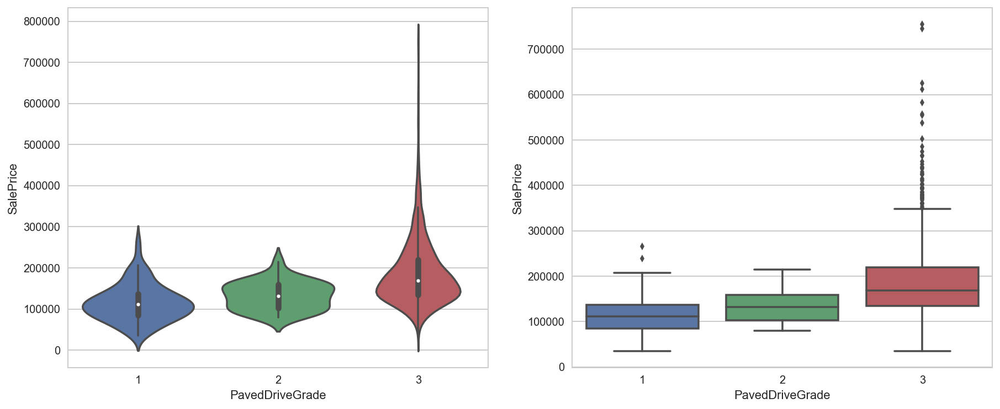

PoolQCGrade
   PoolQCGrade  Counts
0          1.0       3
1          2.0       2
2          3.0       2


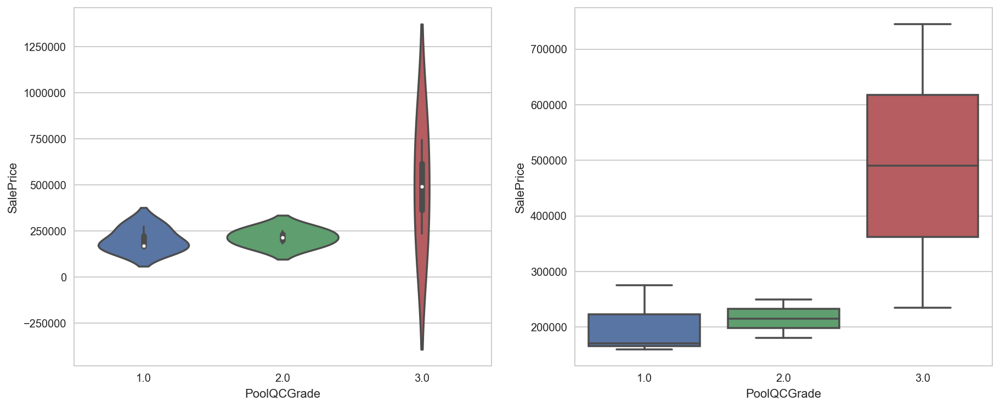

FenceGrade
   FenceGrade  Counts
0         1.0      11
1         2.0     157
2         3.0      54
3         4.0      59


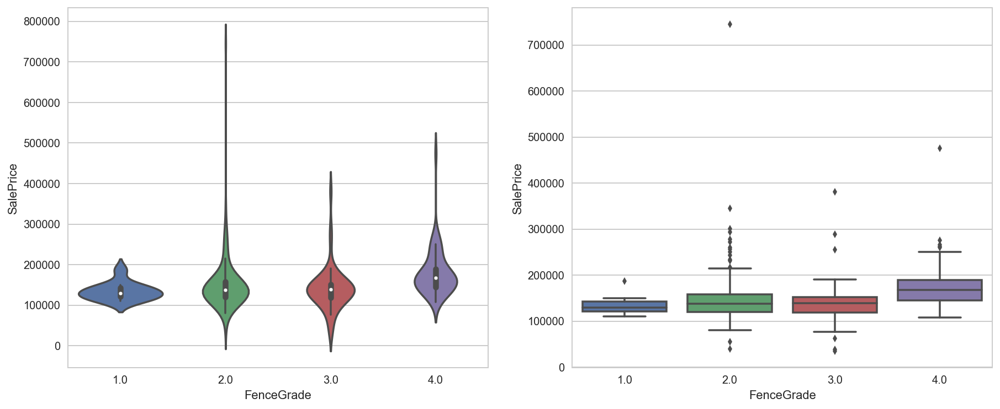

MiscFeatureGrade
   MiscFeatureGrade  Counts
0               1.0       2
1               2.0      49
2               3.0       2
3               4.0       1


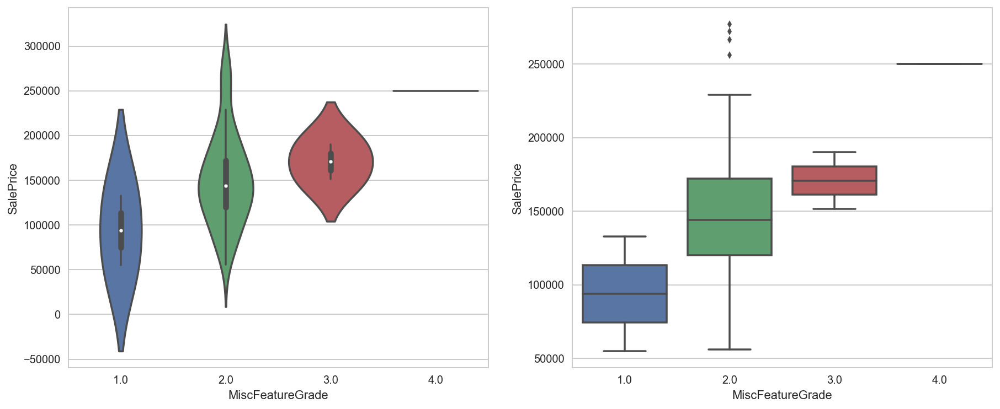

SaleTypeGrade
   SaleTypeGrade  Counts
0              1       3
1              2       5
2              3      43
3              4       9
4              5       5
5              6    1267
6              7       4
7              8     122
8              9       2


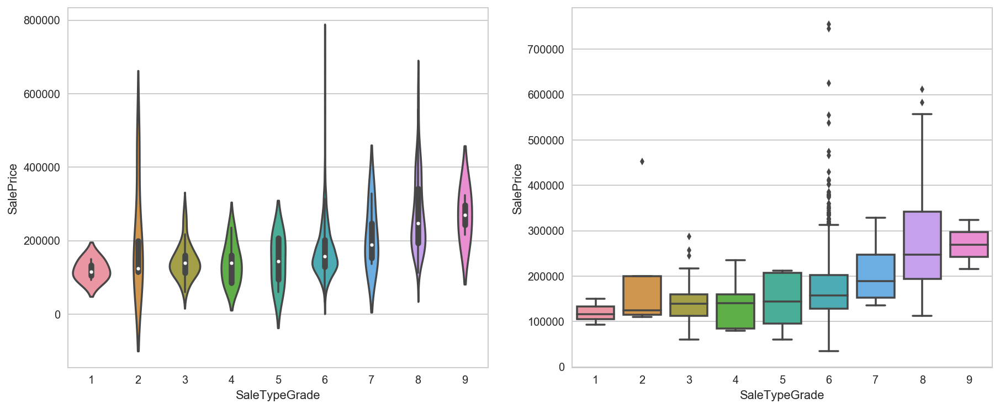

SaleConditionGrade
   SaleConditionGrade  Counts
0                   1       4
1                   2     101
2                   3      20
3                   4      12
4                   5    1198
5                   6     125


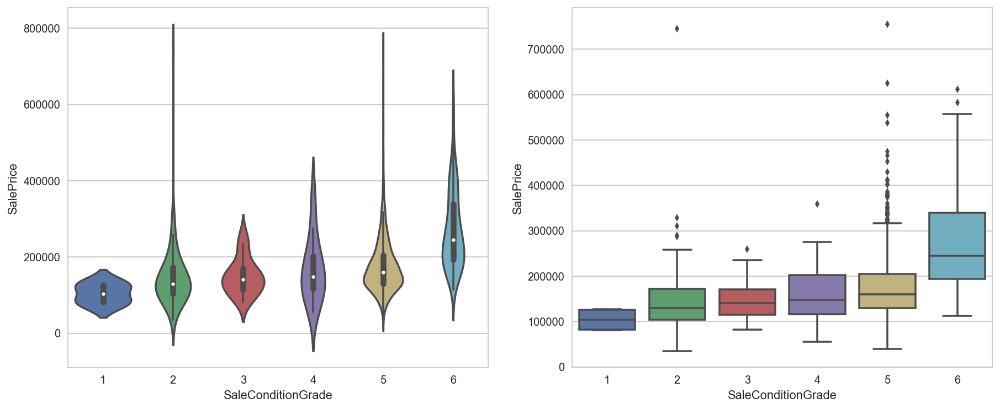

In [18]:
# 숫자 부여 후
col_names = df_str_new.columns

plt.rcParams["figure.figsize"] = (15,6)
for col_name in col_names[:-1]:
    show_viobox(df_str_new, col_name)

## 각 변수와 saleprice 간의 상관관계 확인(heatmap 이용)

In [13]:
%matplotlib inline
%config InlineBackend.figure_formats = {'png', 'retina'}

### 숫자데이터와의 상관관계

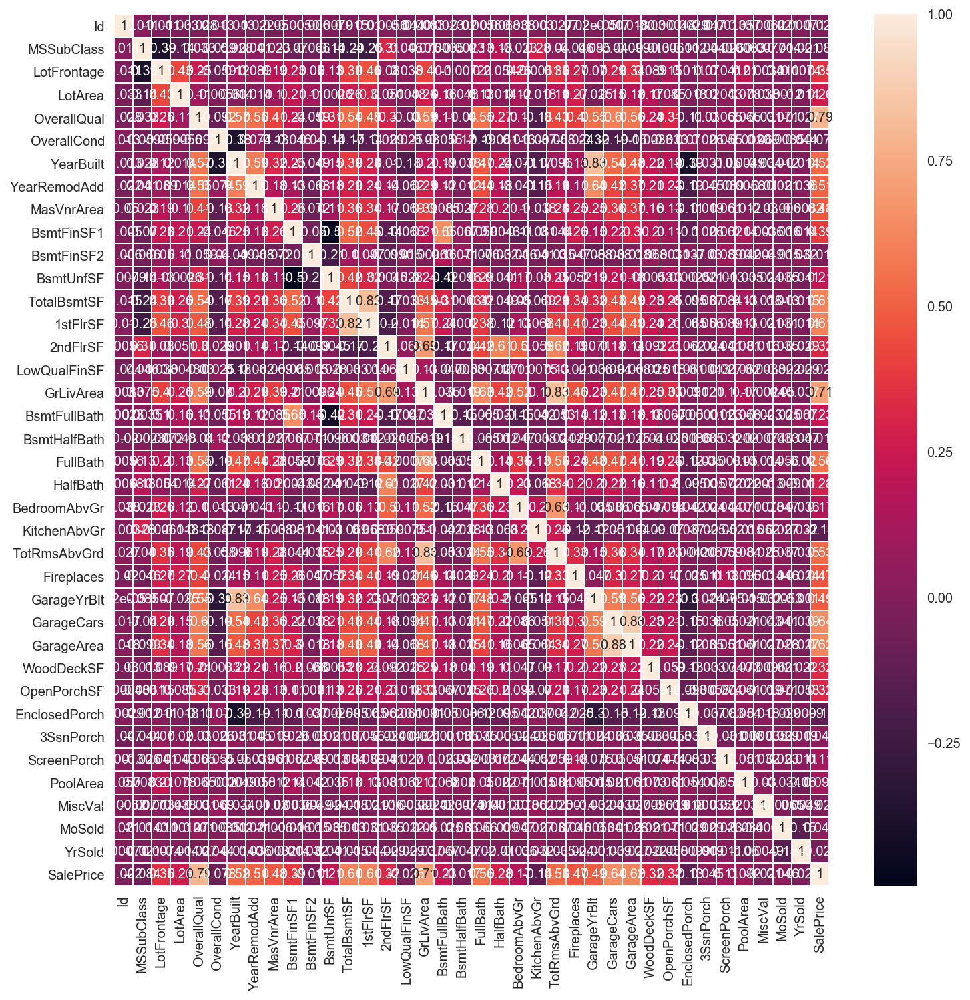

SalePrice       1.000000
OverallQual     0.790982
GrLivArea       0.708624
GarageCars      0.640409
GarageArea      0.623431
TotalBsmtSF     0.613581
1stFlrSF        0.605852
FullBath        0.560664
TotRmsAbvGrd    0.533723
YearBuilt       0.522897
YearRemodAdd    0.507101
GarageYrBlt     0.486362
MasVnrArea      0.477493
Fireplaces      0.466929
BsmtFinSF1      0.386420
LotFrontage     0.351799
WoodDeckSF      0.324413
2ndFlrSF        0.319334
OpenPorchSF     0.315856
HalfBath        0.284108
Name: SalePrice, dtype: float64

In [14]:
# 숫자 데이터에 대한 상관관계 확인
heat= df_num.corr()
fig, ax = plt.subplots(figsize=(12,12))         # Sample figsize in inches
sns.heatmap(heat.iloc[:, :], annot=True, linewidths=.5, ax=ax)
plt.show()

# saleprice와의 상관관계만 보기. 내림차순으로. 상위 20개만
heat["SalePrice"].sort_values(ascending=False).head(20)

## 문자 데이터에 대한 상관관계 확인

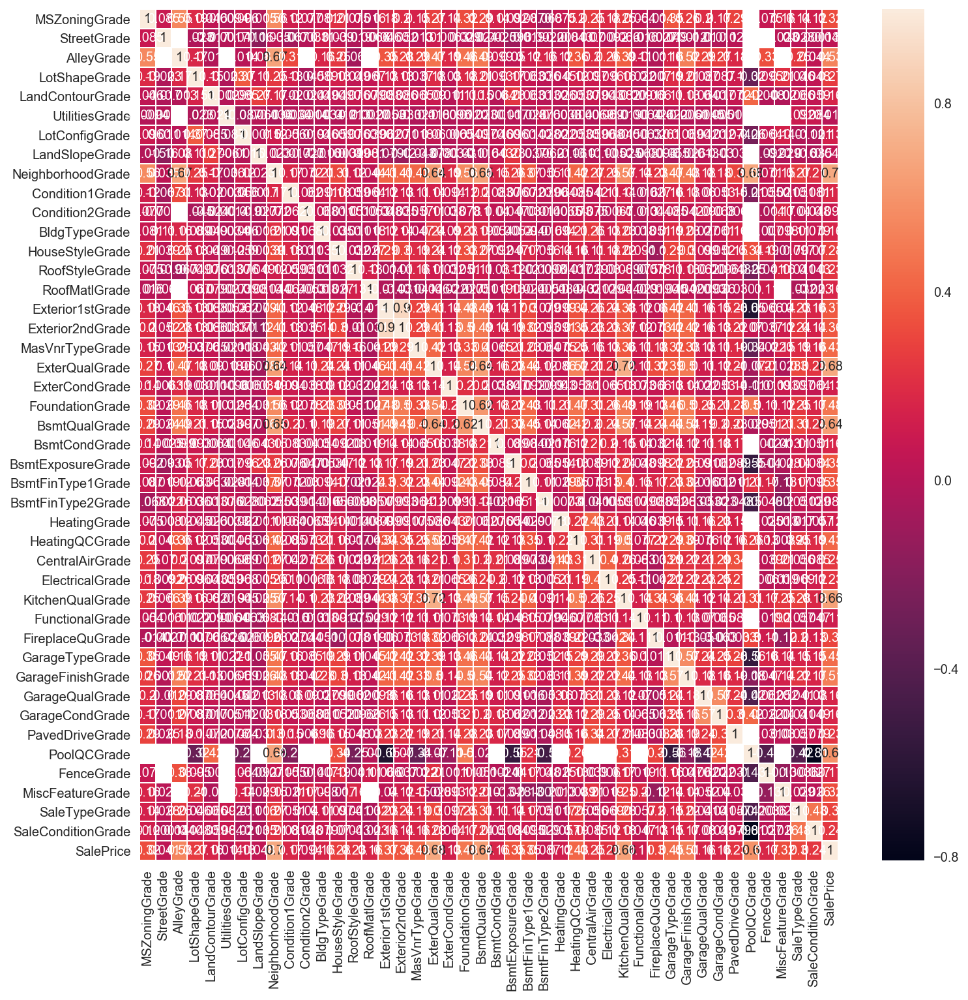

SalePrice            1.000000
NeighborhoodGrade    0.696158
ExterQualGrade       0.682639
KitchenQualGrade     0.659600
BsmtQualGrade        0.644019
PoolQCGrade          0.595229
AlleyGrade           0.534319
GarageFinishGrade    0.513105
FoundationGrade      0.478431
GarageTypeGrade      0.445945
MasVnrTypeGrade      0.429020
HeatingQCGrade       0.427649
Exterior1stGrade     0.371018
Exterior2ndGrade     0.362052
BsmtFinType1Grade    0.354137
BsmtExposureGrade    0.352958
MSZoningGrade        0.324610
MiscFeatureGrade     0.322456
SaleTypeGrade        0.297769
FireplaceQuGrade     0.295794
Name: SalePrice, dtype: float64

In [15]:
# 문자 데이터에 대한 상관관계 확인 - 숫자로 치환해준 dataframe에 대해 진행
heat= df_str_new.corr()
fig, ax = plt.subplots(figsize=(12,12))         # Sample figsize in inches
sns.heatmap(heat.iloc[:, :], annot=True, linewidths=.5, ax=ax)
plt.show()

# saleprice와의 상관관계만 보기. 내림차순으로. 상위 20개만
heat["SalePrice"].sort_values(ascending=False).head(20)